 Mask R-CNN + FCN - Test on COCO Dataset

Run the Mask R-CNN net in inference mode, with the additional PCILayer that generates the context-based tensor 

# Setup Pipeline -  (build model and load weights)

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline
%load_ext autoreload
%autoreload 2
import sys,os, pprint, pickle, json
pp = pprint.PrettyPrinter(indent=2, width=100)
print('Current working dir: ', os.getcwd())
if '..' not in sys.path:
    print("appending '..' to sys.path")
    sys.path.append('..')
import numpy as np
import warnings
import mrcnn.utils     as utils
import mrcnn.visualize as visualize
import mrcnn.visualize_2 as vis2
from mrcnn.prep_notebook import build_fcn_inference_pipeline, build_mrcnn_inference_pipeline,run_mrcnn_detection
from mrcnn.prep_notebook import get_inference_batch, get_image_batch, run_mrcnn_detection, run_fcn_detection
from mrcnn.visualize     import display_training_batch
from mrcnn.coco          import prep_coco_dataset
from mrcnn.utils import trim_zeros, compute_overlaps
from mrcnn.calculate_map import update_map_dictionaries
warnings.filterwarnings('ignore', '.*output shape of zoom.*')


MRCNN_WEIGHT_FILE = '/home/kbardool/models_coco/ESAT_train_mrcnn_subset/mrcnn20181224T0000/mrcnn_2365.h5'
MRCNN_WEIGHT_FILE = 'last'
FCN_WEIGHT_FILE = 'last'
##------------------------------------------------------------------------------------
## Parse command line arguments
##------------------------------------------------------------------------------------
parser = utils.command_line_parser()
input_parms  =" --batch_size     1  "
input_parms +=" --dataset        coco2014"
input_parms +=" --mrcnn_logs_dir ESAT_train_mrcnn_subset "
input_parms +=" --fcn_logs_dir   train_fcn8L2_BCE_subset "
input_parms +=" --mrcnn_model    " + MRCNN_WEIGHT_FILE 
input_parms +=" --fcn_model      " + FCN_WEIGHT_FILE 
input_parms +=" --fcn_layer      all"
input_parms +=" --fcn_arch       fcn8l2 " 
input_parms +=" --sysout         screen "
input_parms +=" --scale_factor   4"
input_parms +=" --coco_classes   78 79 80 81 82 44 46 47 48 49 50 51 34 35 36 37 38 39 40 41 42 43 10 11 13 14 15 "

args = parser.parse_args(input_parms.split())
utils.display_input_parms(args)

Current working dir:  /home/kbardool/git_projs/mrcnn3/notebooks
appending '..' to sys.path


Using TensorFlow backend.


 Init Image Class - Possible Object Choices:  {'truck': 3, 'building': 3, 'sun': 1, 'car': 3, 'cloud': 3, 'person': 5, 'tree': 5, 'airplane': 3}
 Init Image Class - Custom Color Keys      :  ['sky', 'sun', 'tree', 'cloud', 'person', 'ground']
 Init Image Class - Object Priority List   :  ['building', 'tree', 'car']
 Init Image Class - BUILD_MAX_TRIES        :  7
 Init Image Class - PERSON_CAR_DISTANCE    :  10

   Arguments passed :
   --------------------
   batch_size                     1
   coco_classes                   [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
   dataset                        coco2014
   epochs                         1
   evaluate_method                1
   fcn_arch                       FCN8L2
   fcn_bce_loss_class             0
   fcn_bce_loss_method            1
   fcn_layers                     ['all']
   fcn_logs_dir                   train_fcn8L2_BCE_subset
   fcn_losses                   

In [2]:
mrcnn_model, fcn_model = build_fcn_inference_pipeline(args = args,verbose = 1)


--> Execution started at: 06-11-2019 @ 13:23:35
    Tensorflow Version: 1.8.0   Keras Version : 2.1.6 
>>> Initialize Paths
 Linx  Linux

   Arguments passed :
   --------------------
   batch_size                     1
   coco_classes                   [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
   dataset                        coco2014
   epochs                         1
   evaluate_method                1
   fcn_arch                       FCN8L2
   fcn_bce_loss_class             0
   fcn_bce_loss_method            1
   fcn_layers                     ['all']
   fcn_logs_dir                   train_fcn8L2_BCE_subset
   fcn_losses                     fcn_BCE_loss
   fcn_model                      last
   last_epoch                     0
   lr                             0.001
   mrcnn_exclude_layers           None
   mrcnn_layers                   ['mrcnn', 'fpn', 'rpn']
   mrcnn_logs_dir                 ESAT_train_mrcn

     append Tensor("fpn_p4/BiasAdd:0", shape=(?, 64, 64, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p5/BiasAdd:0", shape=(?, 32, 32, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p6/MaxPool:0", shape=(?, 16, 16, 256), dtype=float32) to layer_outputs 

>>> RPN Outputs  <class 'list'>
      rpn_class_logits/rpn_class_logits:0
      rpn_class/rpn_class:0
      rpn_bbox/rpn_bbox:0

>>> Proposal Layer - generate  1000  proposals
    Init complete. Size of anchors:  (261888, 4)
     Scores :  (1, 6000)
     Deltas :  (1, 6000, 4)
     Anchors:  (1, 6000, 4)
     Boxes shape / type after processing: 
     Output: Proposals shape :  (1, ?, ?) (1, None, None)

>>> FPN Classifier Graph verbose: 1
    INPUT: rois shape              :  shape: (1, ?, ?)             KB.shape:(None, 1000, 4)       Keras Tensor: True
    INPUT: mrcnn feature_maps      :  value: 4
    -      feature_map P2          :  shape: (?, 256, 256, 256)    KB.shape:(None, 256, 256, 256)  Kera

    alt_scores_2    :              :  shape: (?, 3)                KB.shape:(None, 3)             Keras Tensor: False
    alt_scores_2(scattered)        :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    alt_scores_2_norm(by_class)    :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    gauss_heatmap_sum (final)      :  shape: (1, 256, 256, 81)     KB.shape:(1, 256, 256, 81)     Keras Tensor: False
    gauss_scores    :              :  shape: (1, 81, 200, 24)      KB.shape:(1, 81, 200, 24)      Keras Tensor: False
    complete                       

    Output of CHMLayerInference: 
     pred_tensor        :  (1, 81, 200, 9) Keras tensor  False
     pred_heatmap_norm  :  (1, 256, 256, 81) Keras tensor  False
     pred_heatmap_scores:  (1, 81, 200, 24) Keras tensor  False
     complete
    shape of pr_hm        :        :  shape: (1, 256, 256, 81)     KB.shape:(None, 1024, 1024, 81)  Keras Tensor: True
    shape of p

    FCN fully connected 2 (fc2)    :  shape: (?, 8, 8, 4096)       KB.shape:(None, 8, 8, 4096)    Keras Tensor: True
    FCN conv2d (fcn32_deconv2D)    :  shape: (?, 8, 8, 81)         KB.shape:(None, 8, 8, 81)      Keras Tensor: True
                                   
    --- FCN16 ----------------------------
    FCN scorePool4 (Conv2D(Pool4)) :  shape: (?, 8, 8, 81)         KB.shape:(None, 8, 8, 81)      Keras Tensor: True
    FCN 2x Upsampling (Deconvolution2D(fcn32_classify)):  shape: (?, ?, ?, 81)         KB.shape:(None, 18, 18, 81)    Keras Tensor: True
    FCN 2x Upsampling/Cropped (Cropped2D(score2)):  shape: (?, ?, ?, 81)         KB.shape:(None, 16, 16, 81)    Keras Tensor: True
    FCN Add Score2,scorePool4 Add(score2_c, scorePool4):  shape: (?, 16, 16, 81)       KB.shape:(None, 16, 16, 81)    Keras Tensor: True
    FCN upscore_pool4 (Deconv(fuse_Pool4)):  shape: (?, ?, ?, 81)         KB.shape:(None, 32, 32, 81)    Keras Tensor: True
                                   
    -

    seq_ids                        :  shape: (?,)                  KB.shape:(None,)               Keras Tensor: False
    sscatter_ids                   :  shape: (?, 2)                KB.shape:(None, 2)             Keras Tensor: False
    fcn_scores_by_class            :  shape: (1, 81, 200, 24)      KB.shape:(1, 81, 200, 24)      Keras Tensor: False
    complete                       
    * fcn_heatmap shape:           :  shape: (?, 256, 256, 81)     KB.shape:(None, 256, 256, 81)  Keras Tensor: True
    * fcn_scores shape :           :  shape: (1, 81, 200, 24)      KB.shape:(1, 81, 200, 24)      Keras Tensor: True
 self.keras_model.losses :  21
0      Tensor("block1_conv2/add:0", shape=(), dtype=float32)
1      Tensor("block4_conv1/add:0", shape=(), dtype=float32)
2      Tensor("block5_conv2/add:0", shape=(), dtype=float32)
3      Tensor("fcn32_deconv2D/add:0", shape=(), dtype=float32)
4      Tensor("fcn16_score2/add:0", shape=(), dtype=float32)
5      Tensor("fcn16_upscore_pool4/add

##  Print some information about the model 

In [3]:
# mrcnn_model.config.display()
# fcn_model.config.display()
fcn_model.keras_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_pr_hm_norm (InputLayer)   (None, 256, 256, 81) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 256, 256, 64) 46720       input_pr_hm_norm[0][0]           
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 256, 256, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 128, 128, 64) 0           block1_conv2[0][0]               
__________________________________________________________________________________________________
block2_con

In [ ]:
# for layer in model.keras_model.layers
#     print layer.name 

layers    = [layer for layer in mrcnn_model.keras_model.layers]          # all layer outputs
print(len(layers))

for idx in range(200, len(layers)):
    print( ' layer: {} name: {}'.format(idx, layers[idx].name))
#     print(' layer {} :  {}'.format(idx,layers[idx]))
#     print(' Number of inbound nodes: ', end ='')
#     pp.pprint(len(layers[idx]._inbound_nodes))
#     pp.pprint(layers[idx].__dict__)
#     print('-------------------------------------------')
print('idx : ', idx)
pp.pprint(layers[idx].__dict__)

print()
pp.pprint(layers[idx]._inbound_nodes[0].__dict__)

####  Print Layer & Weight Info

In [ ]:
# keras_model = mrcnn_model.keras_model
# layers = keras_model.inner_model.layers if hasattr(keras_model, "inner_model") else keras_model.layers
# print(dir(layers[0]))
# pp.pprint(layers[7].weights)
print()
for i in range(len(layers)):
    print('\n{:3d} {:20s} Weights: {}'.format(i, layers[i].name, len(layers[i].weights))) ## [weight.name for weight in layers[i].weights]))
    print('{:23s}  Trainable: {} '.format(' ',[weight.name for weight in layers[i].trainable_weights]))
    for weight in layers[i].weights:
        print('{:25s} {:30s} {}  '.format(' ',weight.name,  weight.shape))

####  More layer information

In [ ]:
import pprint
pp = pprint.PrettyPrinter(indent=2, width=100)
np.set_printoptions(linewidth=100,precision=4,threshold=1000, suppress = True)

# model.compile_only(learning_rate=config.LEARNING_RATE, layers='heads')
# print('\n Metrics (_get_deduped_metrics_names():) ') 
# pp.pprint(mm._get_deduped_metrics_names())
# print('\n Losses (model.metrics_names): ') 
# pp.pprint(mm.metrics_names)
# KB.set_learning_phase(0)
# print(' Learning phase values is L ' ,KB.learning_phase())
# print('\Layers ', len(mrcnn_model.keras_model.layers))
# pp.pprint(mrcnn_model.keras_model.layers)

print('\n Weights: ') 
## Get weieights acturally returns weight dims
# print(' Number of weights arrays: ',len(mrcnn_model.keras_model.get_weights()))
print(' length of model.keras_model.weights', len(mrcnn_model.keras_model.weights))
# for i,j in enumerate(mrcnn_model.keras_model.weights):
#     print(i, j) # j.name, j.shape, j.dtype)
# pp.pprint(mrcnn_model.keras_model.weights)
# pp.pprint(type(mrcnn_model.keras_model.get_weights()))

# pp.pprint(dir(model.keras_model))
# print(mrcnn_model.keras_model.weights[1])

#### List trainable layers using `get_trainable_layers()`

In [ ]:
for i in  mrcnn_model.get_trainable_layers():
    print(' Layer:', i.name)       

####  Get a list of trainable layers, i.e., layers that have weights

In [ ]:
# trainable = mrcnn_model.get_trainable_layers()
layers    = [layer for layer in mrcnn_model.keras_model.layers]          # all layer outputs
print('Trn  Idx   Layer Name   \t\t InputNode LayerNames \t\t InputNode LayerShapes')
for idx, layer in enumerate(layers):
    TrnFlg = 'T' if layer.get_weights() else ' '
    all_input_shapes = [node.input_shapes   for node in layer._inbound_nodes][0]
    input_nodes  = [node for node in layer._inbound_nodes]
    all_nodes_layers  = [node.inbound_layers for node in input_nodes]   
#     print(all_input_nodes)
#     all_nodes_layers  = [[node.inbound_layers for node in input_nodes]  for input_nodes in layer._inbound_nodes]  #[node for node in all_input_nodes]]]
    all_input_layer_names = [[layer.name for layer in node_layers] for node_layers in all_nodes_layers][0]        
    str_names = ','.join(map(str, all_input_layer_names)) 
    str_shapes = ','.join(map(str, all_input_shapes)) 
    print(' {} ; {:3d} ; {:25s}; {:30s}; {:30s} '.format( TrnFlg, idx, layer.name,  str_names, str_shapes))

In [8]:
print()    
for i in range(194,len(layers)):
# for i in [206]:
    layer = layers[i]
    print('====================================================='.format(i))
    print('== Layer {} : {} '.format(i,layer.name))
    print('====================================================='.format(i))
    pp.pprint(layer.__dict__)
    print()
    for j,node in enumerate(layer._inbound_nodes):
        print('== Inbound Node {} ========================================='.format(j))
        print(type(node))
        pp.pprint(node.__dict__)
        node_inlayers_names = [n.name for n in node.inbound_layers]
        print(node_inlayers_names)

NameError: name 'layers' is not defined

# Build test datasets

In [3]:
print('load coco classes: ', args.coco_classes)

# dataset_test, test_generator = prep_coco_dataset(["train", "val35k"], mrcnn_model.config, generator = True , return_coco = False, load_coco_classes = args.coco_classes)
dataset_test, test_generator = prep_coco_dataset(["minival"], mrcnn_model.config, generator = True , return_coco = False, load_coco_classes = args.coco_classes)
# dataset_test.display_class_info()
dataset_test.display_active_class_info()
print("Testing Dataset Image Count: {}".format(len(dataset_test.image_ids)))
print("Testing Dataset Class Count: {}".format(dataset_test.num_classes))
class_names = dataset_test.class_names


load coco classes:  [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
          !!! Loading annotations for ACTIVE CLASSES ONLY !!!
 Dataset dir :  /home/kbardool/MLDatasets/coco2014  subset:  minival
loading annotations into memory...
Done (t=0.78s)
creating index...
index created!
 load subset of classes:  [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
 image dir            :  /home/kbardool/MLDatasets/coco2014/val2014
 json_path_dir        :  /home/kbardool/MLDatasets/coco2014/annotations/instances_minival2014.json
 number of images     :  2416
 image_ids[:10]       :  [532481, 385029, 311303, 393226, 532493, 458768, 327701, 434204, 24610, 344100]
 image_ids[1000:1010] :  [527695, 322895, 175438, 314709, 109916, 355677, 273760, 216419, 52591, 290163]
Prepares complete
 Active Class Information 
--------------------------
[10, 11, 12, 13, 14, 30, 31, 32, 33, 34, 35

###  Display some images from dataset

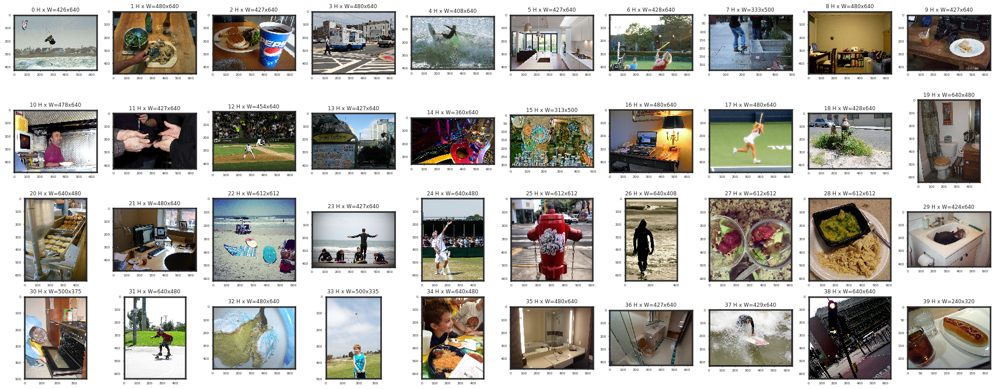

In [4]:
image_list = list(range(40))
image_titles = [str(i) for i in image_list]
images = get_image_batch(dataset_test, image_list)
visualize.display_images(images, titles = image_titles, cols = 10, width = 30)


GT_BOXES for image  159
--------------------------------------------------------------------------------
        class             |                              
seq  id name              |  Y1  X1  Y2  X2     CX     CY    AREA
--------------------------------------------------------------------------------
  0 39 tennis racket      | 515 694 765 996   845.0  640.0  75500.00



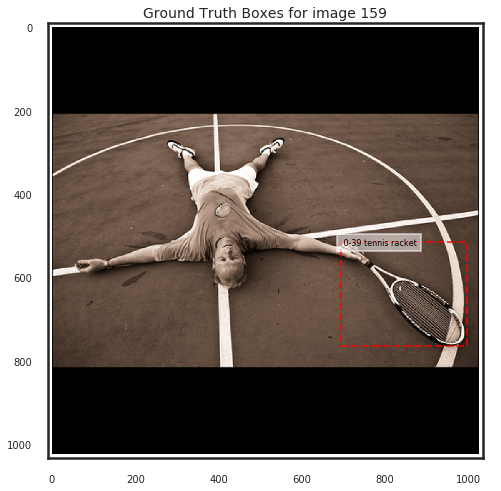

In [5]:
vis2.display_gt_bboxes(dataset_test, mrcnn_model.config, image_id = 159)

# MRCNN Detection pipeline on images

##  Run MRCNN detection pipeline on first image

### Load an image using `get_inference_batch()`

image id :  159
 Image_id    :  159  Reference:  http://cocodataset.org/#explore?id=270908 Coco Id: 270908
 Image meta  :  [ 159  299  500    3  206    0  818 1024]
 Class ids   :  (1,)    [39]
 Class Names :  ['tennis racket']


list

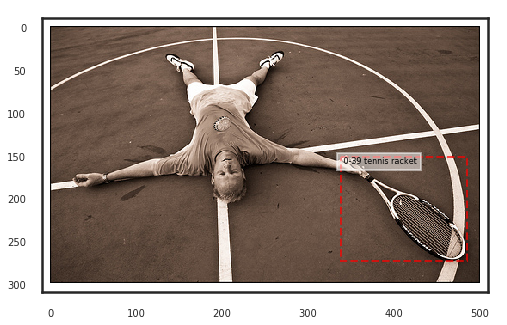

In [6]:
IMAGE_ID = 159
test_batch = get_inference_batch(dataset_test,mrcnn_model.config, IMAGE_ID, display=True)
# image = get_image_batch(dataset_test, 10, display=True)
type(test_batch)

In [7]:
results = run_mrcnn_detection(mrcnn_model,dataset_test, image_ids=IMAGE_ID, verbose = 1)

Image Id  : 159     External Id: coco.270908     Image Reference: http://cocodataset.org/#explore?id=270908
===>  mrcnn_model.detect()
Processing 1 images
image                    shape: (299, 500, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1024.00000
===>  call mrcnn_model.predict()
===> return from  mrcnn_model.predict()
     detections        :  (1, 200, 7)
     rpn_roi_proposals :  (1, 1000, 4)
     mrcnn_class       :  (1, 1000, 81)
     mrcnn_bbox        :  (1, 1000, 81, 4)
     pr_hm             :  (1, 256, 256, 81)
     pr_hm_scores      :  (1, 81, 200, 24)

   ===> unmold_detections()
        zero_ix - Number of detections with class_id = 0  (zero_ix.shape)      :  (195,)
        zero_ix[:10]                                                           :  [ 5  6  7  8  9 10 11 12 13 14]
        N       - Number of non-

In [ ]:
r = results[0]
import matplotlib.pyplot as plt
for i in test_batch:
    print(type(i), i.shape, i.dtype, i.min(), i.max())
plt.imshow(test_batch[0][0])

<class 'numpy.ndarray'> (1, 299, 500, 3) float32 0.0 255.0
<class 'numpy.ndarray'> (1, 1024, 1024, 3) float32 -123.7 151.1
<class 'numpy.ndarray'> (1, 89) int64 0 1024


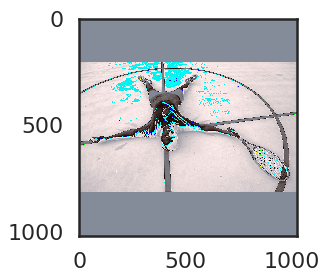

In [9]:
plt.imshow(test_batch[1][0].astype(np.uint8))
# print(r['class_ids'])
# print(r['pr_hm_scores'][39])

###  Display Results

In [10]:
np_format = { 'float' : lambda x: "%10.4f" % x,
              'int'   : lambda x: "%10d" % x}
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

#### Display MRCNN scores - 1st style


GT_BOXES for image  159
--------------------------------------------------------------------------------
        class             |                              
seq  id name              |  Y1  X1  Y2  X2     CX     CY    AREA
--------------------------------------------------------------------------------
  0 39 tennis racket      | 515 694 765 996   845.0  640.0  75500.00


IMAGE_ID :  159
ext.id: 43 --> 39 - tennis racket 


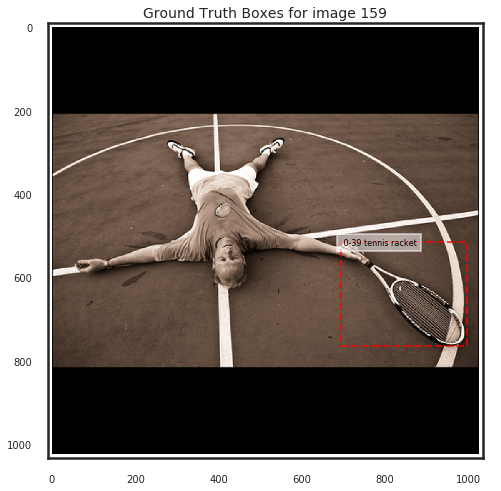

In [11]:
vis2.display_gt_bboxes(dataset_test, mrcnn_model.config, image_id = IMAGE_ID)
dataset_test.display_annotation_info(159)

PR_SCORES from fcn/mrcnn_results:
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                              |   |                |        MRCNN score 0       |          MRCNN score 1             |           MRCNN score 2            |                         
          class               |TP/| mrcnn  normlzd |  gaussian   bbox   nrm.scr*|  ga.sum    mask     score   norm   |  ga.sum    mask     score   norm   |                         
    seq  id name              | FP| score   score  |    sum      area   gau.sum |  in mask   sum              score  |  in mask   sum              score  |  X1  Y1  X2  Y2   AREA  
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
  0 200 39 tennis racket      | 1 | 0.9987  1.0000 |   1.0000  3936.6  

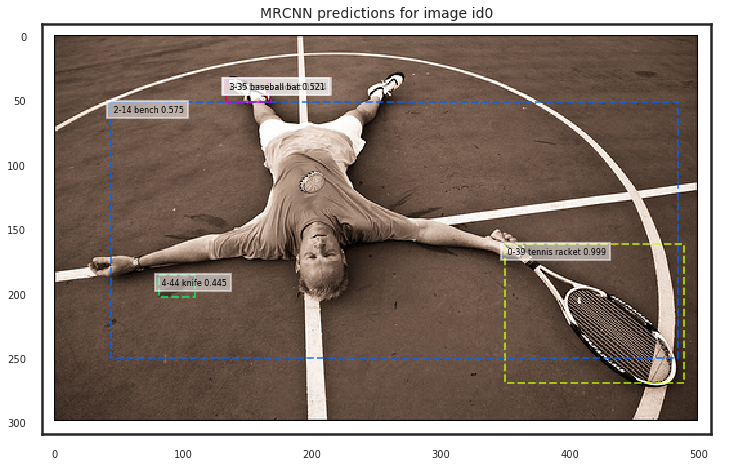

In [12]:
r = results[0]
only = [42,72,46,36,43,44]
vis2.display_pr_scores(r, class_names, only = None)

In [13]:
vis2.display_pr_hm_scores(r, class_names)
vis2.display_pr_hm_scores_box_info(r, class_names)

(81, 200, 24)
  classes     :  range(0, 81)
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                         |  |                 |           alt score 0      |              alt score 1              |                alt score 2            |
        class            |  | mrcnn   normlzd |  gauss     bbox   nrm.scr* |  ga.sum     mask    score      norm   |   ga.sum     mask     score   norm    |
seq  id     name         |  | score   score   |  sum       area   gau.sum  |  in mask    sum                score  |   in mask    sum              score   |    CX      CY      AREA
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
198  14 bench            | 1| 0.5753   1.0000 | 1.0000  22893.7500   1.0000 | 234.7806  330.000

#### Display MRCNN scores - 1st style

In [15]:
# CLASS_COLUMN        = 4
# ORIG_SCORE_COLUMN   = 5
# DT_TYPE_COLUMN      = 6
# SEQUENCE_COLUMN     = 7
# NORM_SCORE_COLUMN   = 8    
# BBOX_AREA_COLUMN    = 10
# SCORE_0_COLUMN      = 11
# CLIP_AREA_COLUMN    = 13
# SCORE_1_COLUMN      = 14 
# SCORE_1_NORM_COLUMN = 17
# SCORE_2_COLUMN      = 20
# SCORE_2_NORM_COLUMN = 23
vis2.display_mrcnn_style1(r, class_names)

       classes : [        39         39         14         35         44]
               :  nis racket nis racket      bench seball bat      knife
                 [         1          1          1          1          1]
   orig scores : [    0.9987     0.6535     0.5753     0.5206     0.4446]
   orig scores : [    0.9987     0.6535     0.5753     0.5206     0.4446]
   norm scores : [    1.0000     0.6543     1.0000     1.0000     1.0000]
            X1 : [  350.0000   133.0000    44.0000   134.0000    81.0000]
            Y1 : [  161.0000    33.0000    51.0000    33.0000   185.0000]
            X2 : [  489.0000   165.0000   484.0000   168.0000   109.0000]
            Y2 : [  269.0000    51.0000   250.0000    51.0000   202.0000]
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 SCR 0    [11] : [    1.0000     0.6312     1.0000     0.9716     0.9560]



####  Display MRCNN scores - 2nd style

In [21]:
vis2.display_mrcnn_style2(r, class_names)    

0 (39)-  tennis racket.....  0.9987 [   39.0000     0.9987     1.0000   200.0000     1.0000]  
                                                      Bbox Coordinates - molded_rois:  [       537        717        758       1002]
                                                      Bbox Coordinates - pr_scores  :  [  161.0000   350.0000   269.0000   489.0000]

                                                                    Orig/Norm score :  [    0.9987     1.0000]
                                                                   mrcnn old scores :  [    1.0000  3936.5625     1.0000]

                                                                  mrcnn alt scores1 :  [   92.7352   132.0000     0.7025     1.0000     1.0000     1.0000]

                                                                  mrcnn alt scores2 :  [   92.7352   132.0000     0.7025     1.0000     1.0000     1.0000]

1 (39)-  tennis racket.....  0.6535 [   39.0000     0.6535     1.0000   199.0000     0.6543]

#### Display MRCNN scores - 3rd style

In [22]:
# for scr, pr_scr in zip(r['scores'], r['pr_scores']):
#     print("{:7.5f}   pr: {:7.5f}  norm_scr: {:7.5f}   ALT Scr0: {:7.5f}  Alt1: {:7.5f}  Alt2: {:7.5f}".format(scr, pr_scr[5], pr_scr[8], pr_scr[11], pr_scr[14], pr_scr[20]))

In [14]:
np_format = { 'float' : lambda x: "%10.4f" % x, 'int'   : lambda x: "%10d" % x}
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

In [23]:
for i in range(results[0]['pr_scores'].shape[0]):
    print(results[0]['pr_scores'][i,4:18])

[  10.0000    0.9984    1.0000  200.0000    1.0000    0.9304  133.0000    0.9304   18.3893   28.0000    0.6568    0.9607    0.9333    0.9607]
[  10.0000    0.9973    1.0000  199.0000    0.9988    0.9146  128.2500    0.9135   19.1409   28.0000    0.6836    1.0000    0.9333    1.0000]
[  10.0000    0.9956    1.0000  198.0000    0.9972    0.9030  145.2500    0.9005   18.7915   28.0000    0.6711    0.9817    0.9333    0.9817]
[  10.0000    0.9951    1.0000  197.0000    0.9966    0.9384  109.6875    0.9352   15.6882   24.0000    0.6537    0.8196    0.8000    0.9562]
[  10.0000    0.9949    1.0000  196.0000    0.9964    0.9511  148.7500    0.9476   18.0561   30.0000    0.6019    0.9433    1.0000    0.8804]
[  10.0000    0.9933    1.0000  195.0000    0.9949    0.9458  148.6250    0.9410   18.7256   28.0000    0.6688    0.9783    0.9333    0.9783]
[  10.0000    0.9860    1.0000  194.0000    0.9875    0.9518  108.7500    0.9399   16.0613   24.0000    0.6692    0.8391    0.8000    0.9790]
[  10.

In [23]:
print(r['detections'])

[[  537.0000   717.0000   758.0000  1002.0000    39.0000     0.9987     1.0000]
 [  274.0000   274.0000   312.0000   338.0000    39.0000     0.6535     1.0000]
 [  311.0000    92.0000   718.0000   992.0000    14.0000     0.5753     1.0000]
 [  274.0000   275.0000   311.0000   346.0000    35.0000     0.5206     1.0000]
 [  585.0000   166.0000   620.0000   224.0000    44.0000     0.4446     1.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0

### Display detections on Image

Image Meta:  [        54        333        500          3        171          0        853       1024          1          1]


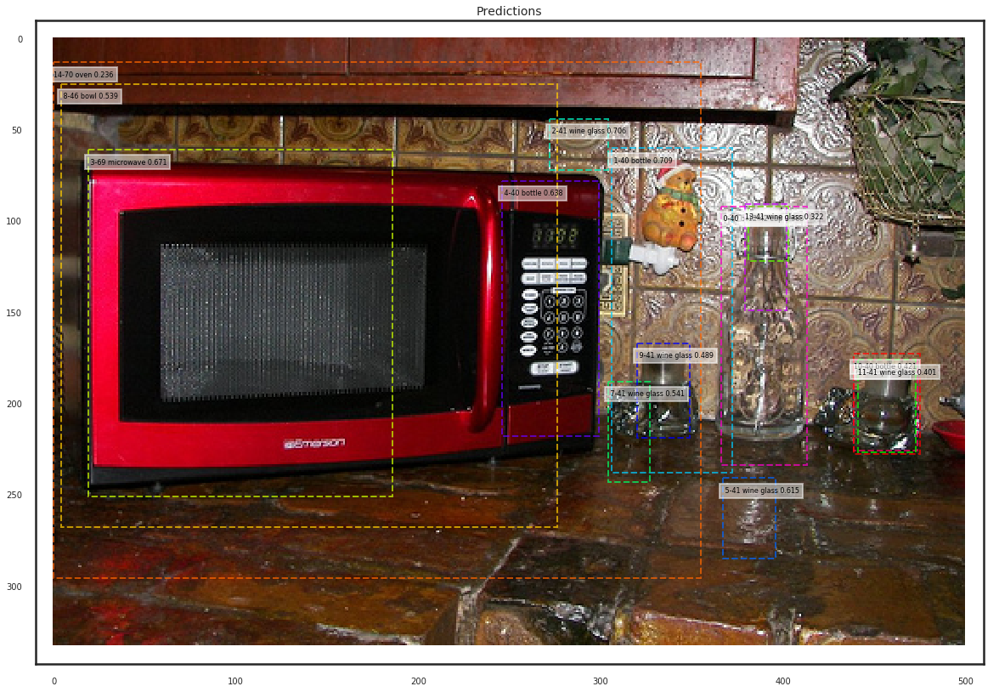

In [23]:
from mrcnn.utils import log # Display results
ax = visualize.get_ax(rows =1, cols = 1, size= 20)
r = results[0]
print('Image Meta: ', r['orig_image_meta'][:10])
visualize.display_instances(r['image'], r['rois'],  r['class_ids'], dataset_test.class_names, r['scores'], 
                            ax=ax, title="Predictions", score_range=(0.0, 1.7))

### Compute mAP and Display Precision/Recall Curve

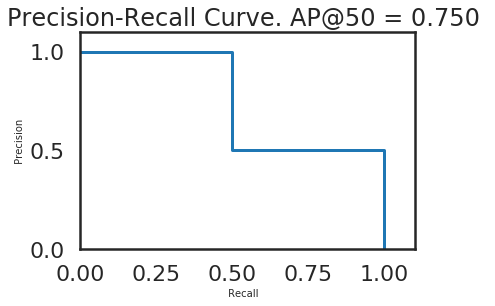

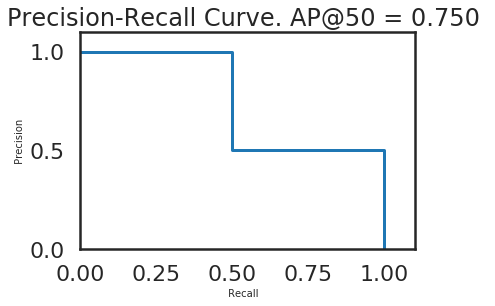

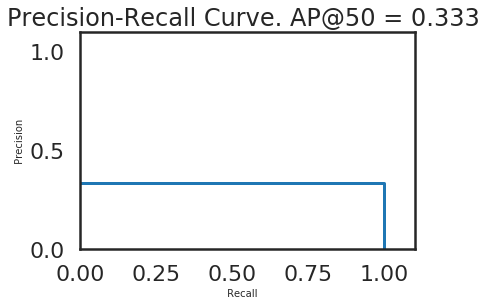

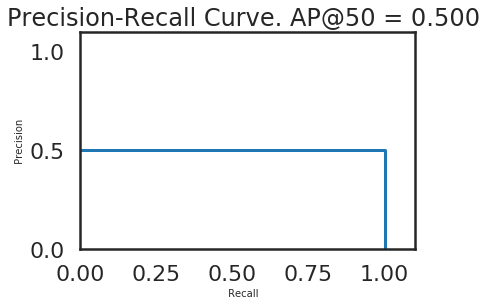

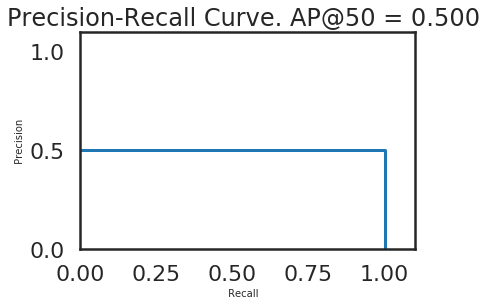

In [24]:
orig_score = 5
norm_score = 8
alt_scr_0  = 11
alt_scr_1  = 14   # in MRCNN alt_scr_1 ans alt_scr_2 are the same
alt_scr_2  = 20

# Draw precision-recall curve
r = results[0]
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['scores'])
visualize.plot_precision_recall(AP, precisions, recalls)
# same as above
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,orig_score])
visualize.plot_precision_recall(AP, precisions, recalls)
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,norm_score])
visualize.plot_precision_recall(AP, precisions, recalls)
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,alt_scr_0])
visualize.plot_precision_recall(AP, precisions, recalls)
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,alt_scr_1])
visualize.plot_precision_recall(AP, precisions, recalls)
 

##  Run MRCNN detection pipeline on second image

### Load an image using `get_inference_batch()`

In [ ]:
# from mrcnn.prep_notebook import get_image_batch, get_training_batch
# # images = get_image_batch(dataset_test, 4737, display = True)
image, _ = get_inference_batch(dataset_test,mrcnn_model, 4745, display=True)

Display  1 images
image                    shape: (640, 448, 3)         min:    0.00000  max:  255.00000


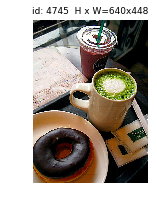



 config.DETECTION_MAX_INSTANCES:  200
 Detections shape: (13, 7)
 mrcnn.evaluate() : Return from  predict()
    Length of detections   :  1
    Length of rpn_roi_proposals   :  1
    Length of mrcnn_class  :  1
    Length of mrcnn_bbox   :  1
    Length of pr_hm        :  1
    Length of pr_hm_scores :  1

   boxes_to_image_domain(): image_meta:  <class 'numpy.ndarray'> (89,)
Image meta:  [4745  640  448    3    0  153 1024  870    1    1]


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\scipy\ndimage\interpolation.py:583: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


In [49]:
# from mrcnn.prep_notebook import run_fcn_detection
# fcn_results, fcn_gt_data = run_fcn_detection(fcn_model, mrcnn_model,dataset_test, image_id=1927, verbose = 1)
results= run_mrcnn_detection(mrcnn_model,dataset_test, image_ids=4745, verbose = 0, display = True)

###  Display Results

In [50]:
np_format = {}
float_formatter = lambda x: "%10.4f" % x
int_formatter   = lambda x: "%10d" % x
np_format['float'] = float_formatter
np_format['int']   = int_formatter
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

#### Display MRCNN scores - 1st style

In [51]:
lmt =15
r = results[0]
print('       classes :', r['class_ids'][:lmt])
names  = " ".join([ '{:>10s}'.format(class_names[i][-10:]) for i in r['class_ids'][:lmt]])

print('               : ', names)
print('                ', r['detection_ind'][:lmt])
print('   orig scores :',r['scores'][:lmt])
print('   norm scores :', r['pr_scores'][:lmt,8])
# print('  pr_scores[5] :', r['pr_scores'][:,5])

print('-'*185)
print('   pr_scrs[11] :', r['pr_scores'][:lmt,11])
# print(' fcn_scores[8] :', r['fcn_scores'][:lmt,11])
print()
print(' pr_scores[14] :', r['pr_scores'][:lmt,14])
# print('fcn_scores[13] :', r['fcn_scores'][:lmt,14])
print()
print(' pr_scores[20] :', r['pr_scores'][:lmt,20])
# print('fcn_scores[19] :', r['fcn_scores'][:lmt,20])

       classes : [        42         55         61         74         74         42         61         72         45         40         46         56         42]
               :         cup      donut ning table       book       book        cup ning table       sink      spoon     bottle       bowl       cake        cup
                 [         1          1          1          1          1          1          1          1          1          1          1          1          1]
   orig scores : [    0.9868     0.9839     0.9187     0.9010     0.8916     0.8605     0.7885     0.5879     0.5422     0.5009     0.4983     0.3342     0.3234]
   norm scores : [    1.0000     1.0000     1.0000     1.0000     0.9896     0.8720     0.8583     1.0000     1.0000     1.0000     1.0000     1.0000     0.3277]
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
   pr

### Display detections on Image

Image Meta:  [      4745        640        448          3          0        153       1024        870          1          1]


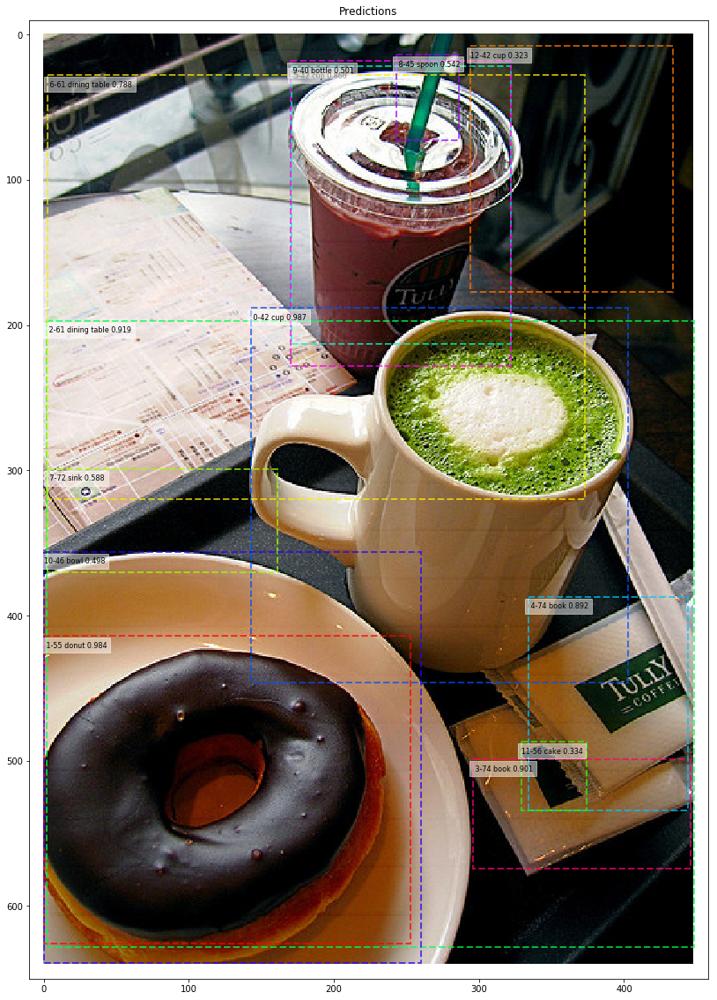

In [52]:
from mrcnn.utils import log # Display results
ax = visualize.get_ax(rows =1, cols = 1, size= 20)
r = results[0]
print('Image Meta: ', r['orig_image_meta'][:10])
visualize.display_instances(r['image'], r['rois'],  r['class_ids'], dataset_test.class_names, r['scores'], 
                            ax=ax, title="Predictions", score_range=(0.0, 1.7))

### Compute mAP and Display Precision/Recall Curve

In [1]:
orig_score = 5
norm_score = 8
alt_scr_0  = 11
alt_scr_1  = 14   # in MRCNN alt_scr_1 ans alt_scr_2 are the same
alt_scr_2  = 18

# Draw precision-recall curve
r = results[0]
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['scores'])
visualize.plot_precision_recall(AP, precisions, recalls,ttl = "- Orig Score")
# same as above
# AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,orig_score])
# visualize.plot_precision_recall(AP, precisions, recalls)
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,norm_score])
visualize.plot_precision_recall(AP, precisions, recalls, ttl = "- Normlzd Score")
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,alt_scr_0])
visualize.plot_precision_recall(AP, precisions, recalls, ttl = "- Alt Score 0 ")
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,alt_scr_1])
visualize.plot_precision_recall(AP, precisions, recalls, ttl = "- Alt Score 1")
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bbox'], r['gt_class_id'], r['molded_rois'], r['class_ids'], r['pr_scores'][:,alt_scr_2])
visualize.plot_precision_recall(AP, precisions, recalls, ttl = "- Alt Score 1")
  

NameError: name 'results' is not defined

##  Run MRCNN detection pipeline on third image

### Load an image using `get_inference_batch()`

In [ ]:
# 13378, 33816
# image, _ = get_inference_batch(dataset_test, mrcnn_model, 13378, display=True)    

In [ ]:
results= run_mrcnn_detection(mrcnn_model,dataset_test, image_id=13378, verbose = 0)
r = results[0]

### Display detections on Image

In [ ]:
print('Image Meta: ', r['orig_image_meta'][:10])
visualize.display_instances(r['image'], r['rois'],  r['class_ids'], dataset_test.class_names, r['scores'], 
                             title="Predictions", score_range=(0.0, 0.7))


# FCN Detection pipeline on images

##  Run FCN detection pipeline on first image

### Load an image using `get_inference_batch()` or `image_id`

Loading 1 images
image                    shape: (299, 500, 3)         min:    0.00000  max:  255.00000


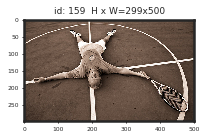

In [52]:
# image, _ = get_inference_batch(dataset_test,mrcnn_model, 33, display=True)

# image = get_image_batch(dataset_test, 44236,display=True)
image = get_image_batch(dataset_test, IMAGE_ID,display=True)

In [55]:
fcn_results = run_fcn_detection(fcn_model, mrcnn_model, dataset_test, image_ids = IMAGE_ID, verbose = 1)

Image Id  : 159     External Id: coco.270908     Image Reference: 
'http://cocodataset.org/#explore?id=270908'
===>   fcn.detect_from_images() 
===>  mrcnn_model.detect()
Processing 1 images
image                    shape: (299, 500, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 89)               min:    0.00000  max: 1024.00000
===>  call mrcnn_model.predict()
===> return from  mrcnn_model.predict()
     detections        :  (1, 200, 7)
     rpn_roi_proposals :  (1, 1000, 4)
     mrcnn_class       :  (1, 1000, 81)
     mrcnn_bbox        :  (1, 1000, 81, 4)
     pr_hm             :  (1, 256, 256, 81)
     pr_hm_scores      :  (1, 81, 200, 24)

   ===> unmold_detections()
        zero_ix - Number of detections with class_id = 0  (zero_ix.shape)      :  (195,)
        zero_ix[:10]                                                           :  [ 5  6  7  8  9 10 11 12 13 

## Display FCN detections on Image

Detected classes: [14 35 39 44]
Image Meta:  [ 159  299  500    3  206    0  818 1024    1    1]


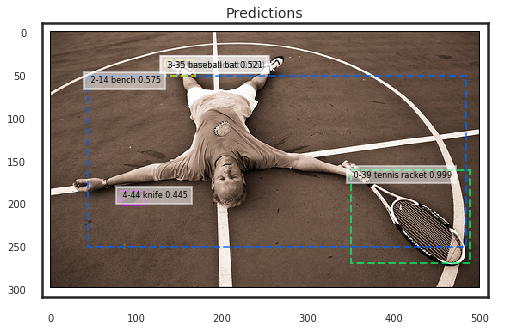

In [56]:
f = fcn_results[0]
print('Detected classes:', np.unique(f['class_ids']))
print('Image Meta: ', f['orig_image_meta'][:10])
visualize.display_instances(f['image'], f['rois'],  f['class_ids'], dataset_test.class_names, f['scores'], title="Predictions", score_range=(0.0, 1.7), size = 8)

GT classes:  [39]
Detected classes: [14 35 39 44]
Image Meta:  [ 159  299  500    3  206    0  818 1024    1    1]
 Image_id    :  159  Reference:  http://cocodataset.org/#explore?id=270908 Coco Id: 270908
 Image meta  :  [ 159  299  500    3  206    0  818 1024    1    1]
 Class ids   :  (1,)    [39]
 Class Names :  ['tennis racket']


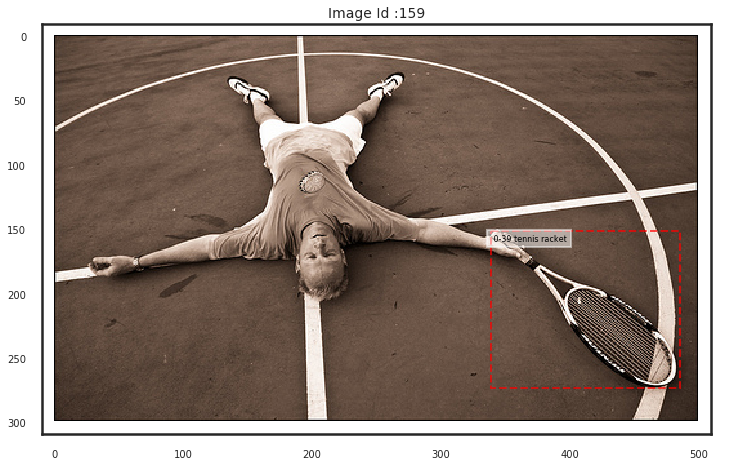

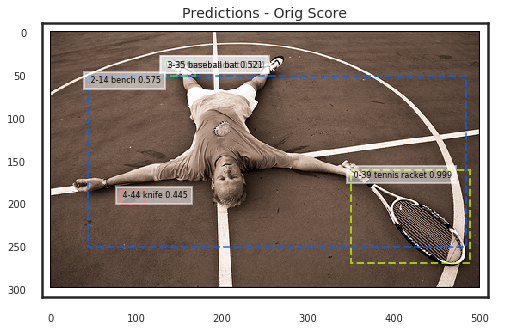

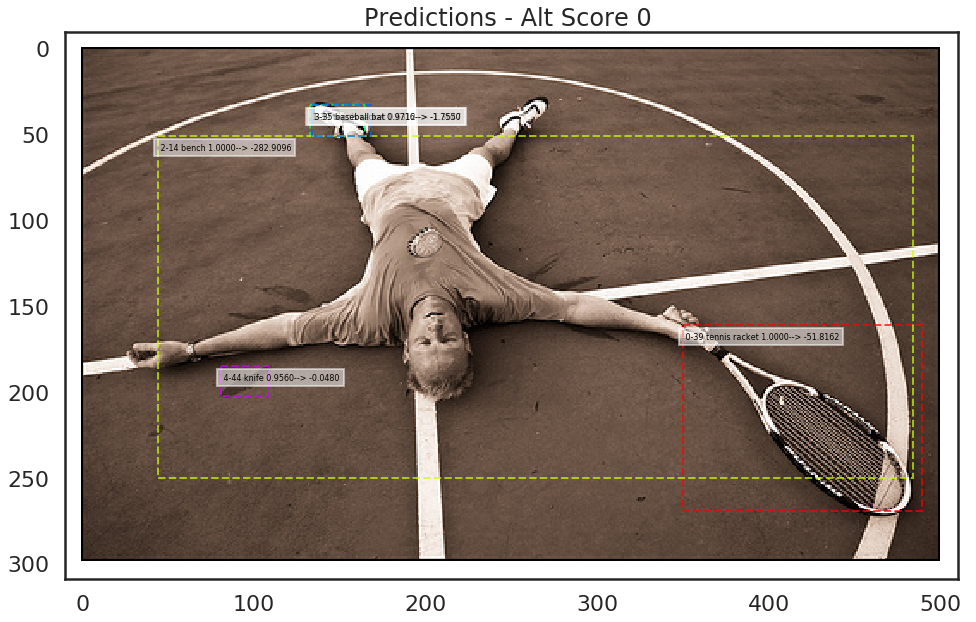

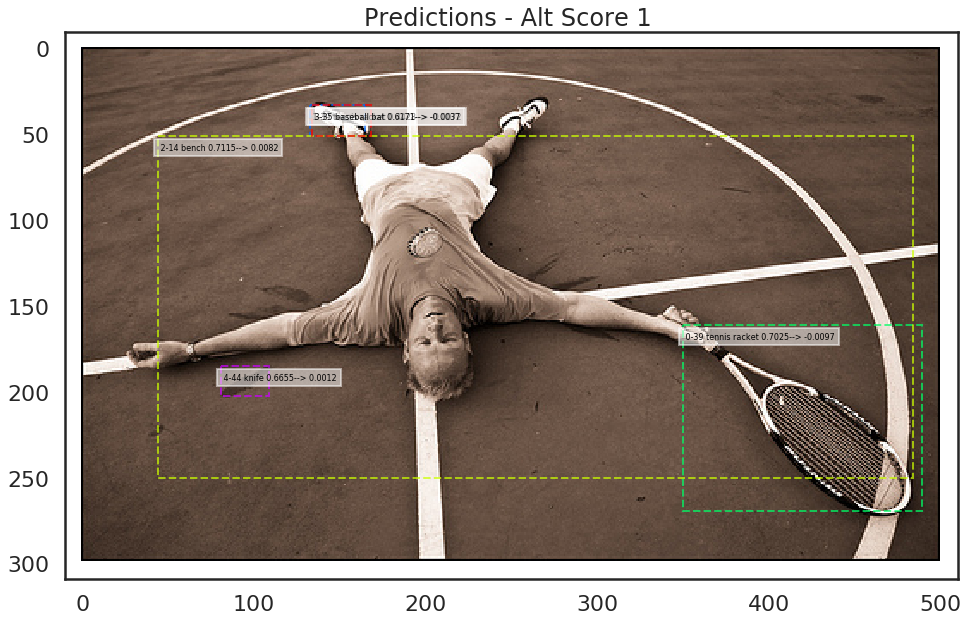

In [58]:
#### Display detections
## old_score   : 11
## alt_score_1 : 14
## alt_score_2 : 20
f = fcn_results[0]
# print('class ids: ', np.unique(f['pr_scores'][:,4]).astype(int).tolist())
det_classes = np.unique(f['class_ids'])
print('GT classes: ', np.unique(f['gt_class_ids']))
print('Detected classes:', det_classes)
print('Image Meta: ', f['orig_image_meta'][:10])
# clses = [42,43,44,45]
clses = None
visualize.display_image_gt(dataset_test, mrcnn_model.config, IMAGE_ID) ## 44236)
# visualize.display_instances_from_prscores(f['image'], f['pr_scores'], class_names, score_range=(-999, 9999), only_classes = [1])
# visualize.display_instances(f['image'], f['rois'],  f['class_ids'], class_names, f['scores'], title="Predictions", score_range=(0.7, 0.99), size = 24)
visualize.display_instances(f['image'], f['rois'], f['class_ids'], class_names, f['scores'], title="Predictions - Orig Score", only_classes=clses)
visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:,11], f['fcn_scores'][:,11],title="Predictions - Alt Score 0 ", only_classes=clses)
visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:,14], f['fcn_scores'][:,14],title="Predictions - Alt Score 1 ", only_classes=clses)
visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:,20], f['fcn_scores'][:,20],title="Predictions - Alt Score 2 ", only_classes=clses)
## display normalized scores 
# visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:, 8], f['fcn_scores'][:, 8],title="Predictions - Orig Score  (Normalized by class)", only_classes=clses)
# visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:,17], f['fcn_scores'][:,17],title="Predictions - Alt Score 1 (Normalized by class)", only_classes=clses)
# visualize.display_instances_two_scores(f['image'], f['rois'], f['class_ids'], class_names, f['pr_scores'][:,23], f['fcn_scores'][:,23],title="Predictions - Alt Score 2 (Normalized by class)", only_classes=clses)


## Display Results
    Length of results from FCN detection:  1

    fcn_results keys: 
    --------------------
    class_ids................  (5,)
    detection_ind............  (5,)
    detections...............  (200, 7)
    fcn_hm...................  (256, 256, 81)
    fcn_hm_scores............  (81, 200, 24)
    fcn_scores...............  (5, 24)
    fcn_scores_by_class......  (81, 200, 24)
    fcn_sm...................  (256, 256, 81)
    gt_bboxes................  (1, 4)
    gt_class_ids.............  (1,)
    image....................  (299, 500, 3)
    image_meta...............  (89,)
    molded_image.............  (1024, 1024, 3)
    molded_rois..............  (5, 4)
    orig_image_meta..........  (89,)
    pr_hm....................  (256, 256, 81)
    pr_hm_scores.............  (81, 200, 24)
    pr_scores................  (5, 24)
    pr_scores_by_class.......  (81, 200, 24)
    rois.....................  (5, 4)
    scores...................  (5,)


In [59]:
np_format = {'float': lambda x: "%10.4f" % x,'int': lambda x: "%10d" % x}
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

#### Display MRCNN and FCN scores - 1st style

In [61]:
#### detections as returned from the model's `detect()` functon

lmt =18
f = fcn_results[0]
vis2.display_pr_fcn_style1(f, class_names)

         bbox seq id : [       200        199        198        197        196]
  f[class_ids] class : [        39         39         14         35         44]
   f[pr_score] class : [        39         39         14         35         44]
  f[fcn_score] class : [        39         39         14         35         44]
                        nis racket nis racket      bench seball bat      knife
           TP/FP Ind : [         1          1          1          1          1]
      pr  orig score : [    0.9987     0.6535     0.5753     0.5206     0.4446]
      fcn orig score : [    0.9987     0.6535     0.5753     0.5206     0.4446]
      cls norm score : [    1.0000     0.6543     1.0000     1.0000     1.0000]
           bbox area : [ 3936.5625   152.0000 22893.7500   164.1875   126.8750]
           clip area : [  132.0000    30.0000   330.0000    30.0000    30.0000]

------------------------------------------------------------------------------------------------------------------------

#### Display MRCNN  and FCN scores - 2nd style

In [76]:
f['detections'][:10]

array([[  537.0000,   717.0000,   758.0000,  1002.0000,    39.0000,     0.9987,     1.0000],
       [  274.0000,   274.0000,   312.0000,   338.0000,    39.0000,     0.6535,     1.0000],
       [  311.0000,    92.0000,   718.0000,   992.0000,    14.0000,     0.5753,     1.0000],
       [  274.0000,   275.0000,   311.0000,   346.0000,    35.0000,     0.5206,     1.0000],
       [  585.0000,   166.0000,   620.0000,   224.0000,    44.0000,     0.4446,     1.0000],
       [    0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000],
       [    0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000],
       [    0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000],
       [    0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000],
       [    0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000,     0.0000]], dtype=float32)

In [75]:
vis2.display_pr_fcn_style2(f, class_names)    

0 [       537        717        758       1002] 39  tennis racket.....  0.9987 [   39.0000     0.9987     1.0000   200.0000     1.0000]  
   [  161.0000   350.0000   269.0000   489.0000] 
   [  161.0000   350.0000   269.0000   489.0000] 
                                                             mrcnn old style scores:   [    1.0000  3936.5625     1.0000]
                                                               fcn old style scores:   [  -51.8162  3936.5625   -51.8162]

                                                                  mrcnn alt scores1:   [   92.7352   132.0000     0.7025     1.0000     1.0000     1.0000]
                                                                    fcn alt scores1:   [   -1.2857   132.0000    -0.0097     0.0000     1.0000     0.0000]

                                                                      mrcnn_scores2:   [   92.7352   132.0000     0.7025     1.0000     1.0000     1.0000]
                                                   

####  Display MRCNN  and FCN scores - 3rd style

In [66]:
vis2.display_pr_fcn_style3(f, class_names)

(200, 7)
  alt_score  0: (gauss. sum over large bbox / bbox area/ gauss_sum * normlzd_score))
  alt_scores 1: (gauss. sum over small mask / mask area/ gauss_sum / mask_area):  
2 [        51         44        250        484]
2 [   51.0000    44.0000   250.0000   484.0000    14.0000     0.5753     1.0000   198.0000     1.0000] 14.0 bench       Original detection

2                                                              pr: alt_scores 0 [9,10,11]:   [    1.0000 22893.7500     1.0000]
2                                                                  alt_scores 1 [12 - 17]:   [  234.7806   330.0000     0.7115     1.0000     1.0000     1.0000]
2                                                                  alt_scores 2 [18 - 23]:   [  234.7806   330.0000     0.7115     1.0000     1.0000     1.0000]
2
2                                                              fcn: alt_score 0 [9,10,11]:   [ -282.9096 22893.7500  -282.9096]
2                                                      

### Compute mAP and Display Precision/Recall Curve

AP : 1.0


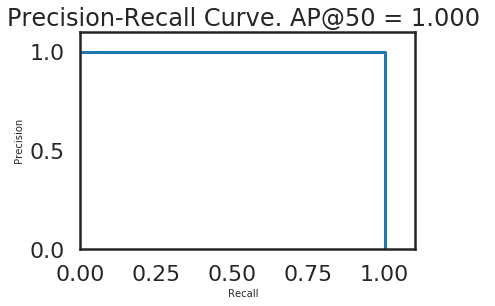

In [67]:
# Draw precision-recall curve
f= fcn_results[0]
AP, precisions, recalls, overlaps = utils.compute_ap(f['gt_bboxes'], f['gt_class_ids'], f['molded_rois'], f['class_ids'], f['scores'])
visualize.plot_precision_recall(AP, precisions, recalls)
print('AP :', AP)

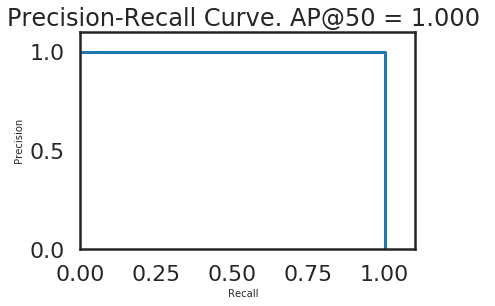

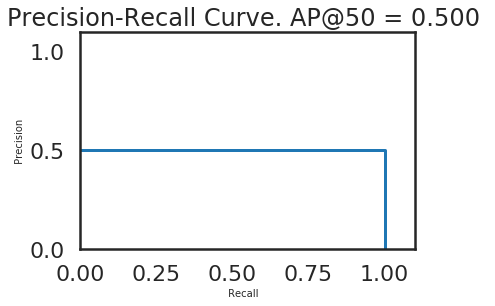

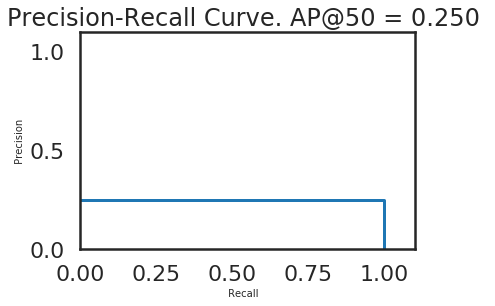

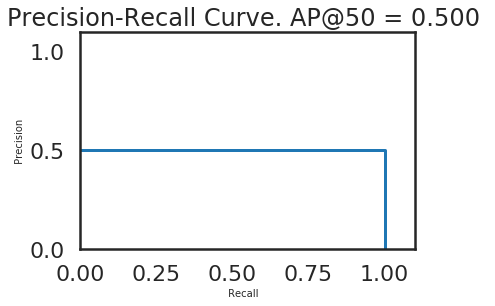

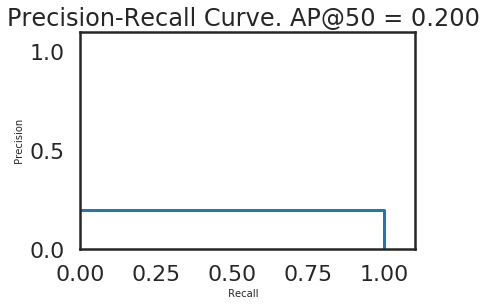

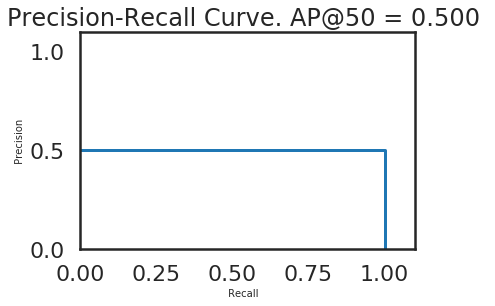

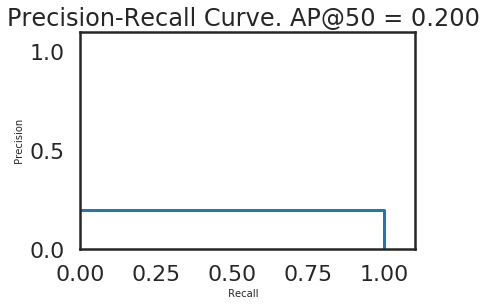

In [70]:
r = fcn_results[0]
AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,orig_score])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_0])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_0])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_1])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_1])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_2])
visualize.plot_precision_recall(AP, precisions, recalls)

AP, precisions, recalls, overlaps = utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_2])
visualize.plot_precision_recall(AP, precisions, recalls)


# Evaluation of mAP  over a number of images

In [26]:
import warnings
from mrcnn.utils import trim_zeros, compute_overlaps
from mrcnn.calculate_map import update_map_dictionaries
warnings.filterwarnings('ignore', '.*output shape of zoom.*')

In [25]:
np_format = { 'float' : lambda x: "%10.4f" % x, 'int'   : lambda x: "%10d" % x}
np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)

## Load weight file

In [29]:
# DIR_WEIGHTS =  'F:/models_newshapes/train_fcn8_l2_newshapes/fcn20181224T0000' ### Training with LR=0.00001, MSE Loss NO L2 Regularization
# DIR_WEIGHTS1 =  '/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20181230T0000'
DIR_WEIGHTS2 =  '/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000'
# DIR_WEIGHTS3 =  '/home/kbardool/models_coco/train_fcn8L2_bce_subset/no_improvement_fcn20181223T0000'
# DIR_WEIGHTS4 =  '/home/kbardool/models_coco/train_fcn8L2_bce_subset/no_improvement_fcn20181224T0000'
# DIR_WEIGHTS5 =  '/home/kbardool/models_coco/train_fcn8L2_bce_subset/no_improvement_fcn20181227T0000'

files1  = [ 'fcn_0001.h5','fcn_0010.h5','fcn_0026.h5','fcn_0162.h5','fcn_0350.h5', 'fcn_0584.h5','fcn_0657.h5','fcn_0950.h5','fcn_1065.h5','fcn_1095.h5','fcn_1108.h5']
files2  = ['fcn_1612.h5','fcn_1673.h5','fcn_2330.h5','fcn_3348.h5','fcn_3742.h5','fcn_3816.h5','fcn_4345.h5']

# files2 =  [ 'fcn_0350.h5', 'fcn_0584.h5','fcn_0657.h5','fcn_0950.h5', 'fcn_1065.h5','fcn_1095.h5','fcn_1108.h5']
# files3  = ['fcn_1294.h5']
# files4  = ['fcn_1065.h5','fcn_1083.h5','fcn_1087.h5','fcn_1213.h5','fcn_1475.h5', 'fcn_1539.h5','fcn_1541.h5','fcn_1567.h5']
# files5  = ['fcn_1065.h5','fcn_1436.h5']


FCN_DIR_WEIGHTS = DIR_WEIGHTS2
fcn_files       = files2
FILE_IDX    = -1

In [21]:
weights_file = os.path.join(FCN_DIR_WEIGHTS  , fcn_files[FILE_IDX])
print("Loading FCN  weights ", weights_file)
fcn_model.load_model_weights(weights_file)

# mrcnn_file = '/home/kbardool/models_coco/train_mrcnn_coco_subset/mrcnn20181220T0000/mrcnn_0385.h5'
# mrcnn_model.load_model_weights(mrcnn_file, verbose = 3)
# print("Loading MRCNN  weights ", mrcnn_file)

Loading FCN  weights  /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5
-----------------------------------------------
 Load Model with init parm: [ /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 ]
-----------------------------------------------
 ---> Explicit weight file
>>> load_weights() from : /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5
    Weights file loaded: /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 
FCN  MODEL Load weight file COMPLETE 


In [35]:
All_APResults = {}

In [12]:
# path = '/home/kbardool/git_projs/mrcnn3/train_coco'
# AP_results_file= 'test_AP_results_2019_01_08'
# with open(os.path.join(path, AP_results_file+'.pkl'), 'rb') as outfile:
#     APRes = pickle.load(outfile)
# All_APResults = APRes

In [41]:
for FILE_IDX in [ -1]:
    weights_file = os.path.join(FCN_DIR_WEIGHTS  , fcn_files[FILE_IDX])
    print("Loading weights ", weights_file)
    fcn_model.load_model_weights(weights_file)
    ###  Initialize data structures 
    orig_score = 5
    norm_score = 8
    alt_scr_0  = 11
    alt_scr_1  = 14   # in MRCNN alt_scr_1 ans alt_scr_2 are the same
    alt_scr_2  = 20
    IMGS       = 500
    
    
    # shuffled_image_ids = np.copy(dataset_test.image_ids)
    # np.random.shuffle(shuffled_image_ids)
    # image_ids = np.random.choice(dataset_test.image_ids, 300)

    image_ids = dataset_test.image_ids[:IMGS]
    image_ids = [159,160]
#     print(len(image_ids))

    class_dict = []
    gt_dict = {}
    pr_dict = {}

    for a,b in zip(dataset_test.class_ids, dataset_test.class_names):
        class_dict.append({'id'   : int(a),
                            'name' : b,
                            'scores': [],
                            'bboxes': [],
                            'mrcnn_score_orig' : [],
                            'mrcnn_score_norm' : [], 
                            'mrcnn_score_0' : [],
                            'mrcnn_score_1' : [],
                            'mrcnn_score_2' : [],
                            'fcn_score_0' : [],
                            'fcn_score_1' : [],
                            'fcn_score_2' : [],      
                            'mrcnn_score_1_norm': [],
                            'mrcnn_score_2_norm': [],                           
                            'fcn_score_1_norm'  : [],
                            'fcn_score_2_norm'  : []                           
                          })

    MRCNN_AP_Orig = []
    MRCNN_AP_0 = [] 
    MRCNN_AP_1 = [] 
    MRCNN_AP_2 = []
    FCN_AP_0   = []
    FCN_AP_1   = []
    FCN_AP_2   = []

    # Compute VOC-Style mAP @ IoU=0.5
    # Running on 10 images. Increase for better accuracy.

    for image_id in image_ids:
#         print('==> Calculate AP for image_id : ', image_id)

        #   Run object detection
        try:
            fcn_results = run_fcn_detection(fcn_model, mrcnn_model, dataset_test, image_id, verbose = 0)
            print('==> Calculate AP for image_id : ', image_id, ' image meta : ', fcn_results[0]['image_meta'][:10])
        except Exception as e :
            print('\n failure on mrcnn predict image id: {} '.format(image_id))
            print('\n Exception information:')
            print(str(e))
            continue
        else:
            gt_dict, pr_dict, class_dict = update_map_dictionaries(fcn_results, gt_dict, pr_dict, class_dict)

            r = fcn_results[0] 
            
            #   Compute AP
            #   AP, precisions, recalls, overlaps
            AP1, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,orig_score])
            MRCNN_AP_Orig.append(AP1)

            AP2, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_0])
            MRCNN_AP_0.append(AP2)

            AP3, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_0])
            FCN_AP_0.append(AP3)

            AP4, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_1])
            MRCNN_AP_1.append(AP4)

            AP5, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_1])
            FCN_AP_1.append(AP5)

            AP6, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["pr_scores"][:,alt_scr_2])
            MRCNN_AP_2.append(AP6)

            AP7, _, _, _= utils.compute_ap(r['gt_bboxes'], r['gt_class_ids'], r["molded_rois"], r["class_ids"], r["fcn_scores"][:,alt_scr_2])
            FCN_AP_2.append(AP7)
#             print(('{:6.4f}   '*7).format(AP1,AP2,AP3,AP4,AP5,AP6,AP7))
            
    print('complete')

    epochs = fcn_files[FILE_IDX].split('_')[1].replace('.h5','')
    print(epochs)

    APResult = {}
    APResult['Filename']      =  weights_file  
    APResult['Epochs']        =  epochs
    APResult['MRCNN_AP_Orig'] =  MRCNN_AP_Orig
    APResult['MRCNN_AP_0'   ] =  MRCNN_AP_0   
    APResult['MRCNN_AP_1'   ] =  MRCNN_AP_1   
    APResult['MRCNN_AP_2'   ] =  MRCNN_AP_2   
    APResult['FCN_AP_0'     ] =  FCN_AP_0     
    APResult['FCN_AP_1'     ] =  FCN_AP_1     
    APResult['FCN_AP_2'     ] =  FCN_AP_2     
    All_APResults[weights_file] = APResult

Loading weights  /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5
-----------------------------------------------
 Load Model with init parm: [ /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 ]
-----------------------------------------------
 ---> Explicit weight file
>>> load_weights() from : /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5
    Weights file loaded: /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 
FCN  MODEL Load weight file COMPLETE 
==> Calculate AP for image_id :  159  image meta :  [ 159  299  500    3  206    0  818 1024    1    1]
molded roi: <class 'numpy.ndarray'> [ 537.0000  717.0000  758.0000 1002.0000]
pr bbox   : [161.0, 350.0, 269.0, 489.0]
fcn bbox  : [161.0, 350.0, 269.0, 489.0]
molded roi: <class 'numpy.ndarray'> [274.0000 274.0000 312.0000 338.0000]
pr bbox   : [33.0, 133.0, 51.0, 165.0]
fcn bbox  : [33.0, 133.0, 51.0, 165.0]
mo

In [40]:
print(len(All_APResults.keys()))
for i in sorted(All_APResults):
    print(i, All_APResults[i]['Epochs'])

vis2.display_AP_results(All_APResults)

1
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 4345


After 4345 training epochs.
Weight file: /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5

Images   Epochs   MRCNN_AP_Orig    MRCNN_AP_0      FCN_AP_0    MRCNN_AP_1      FCN_AP_1    MRCNN_AP_2      FCN_AP_2
--------------------------------------------------------------------------------------------------------------------
10        4345          0.86458       0.44298       0.35049       0.35833       0.33810       0.35833       0.35000
50        4345          0.86458       0.44298       0.35049       0.35833       0.33810       0.35833       0.35000
100       4345          0.86458       0.44298       0.35049       0.35833       0.33810       0.35833       0.35000
250       4345          0.86458       0.44298       0.35049       0.35833       0.33810       0.35833       0.35000
500       4345          0.86458       0.44298       0.35049       0.35833       0.33810     

In [43]:
for key in sorted(All_APResults) :
    print(' AP Result Entry :', key)
    print()
    print('Training for {} epochs. Weight file: {}'.format( All_APResults[key]['Epochs'], All_APResults[key]['Filename']))
    print()
    print("{:6s} {:^10s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s}".format("Images", "Epochs", "MRCNN_AP_Orig", "MRCNN_AP_0", "FCN_AP_0", "MRCNN_AP_1", "FCN_AP_1", "MRCNN_AP_2", "FCN_AP_2"))
    print('-'*116)
#     for LIMIT in [10,50,100,250,500]:
    for ROW in range(500) :  
        print("{:<6d} {:^10s} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f}".format(
                ROW, 
                All_APResults[key]['Epochs'],
                All_APResults[key]['MRCNN_AP_Orig'][ROW], 
                All_APResults[key]['MRCNN_AP_0'][ROW], 
                All_APResults[key]['FCN_AP_0'][ROW], 
                All_APResults[key]['MRCNN_AP_1'][ROW],
                All_APResults[key]['FCN_AP_1'][ROW], 
                All_APResults[key]['MRCNN_AP_2'][ROW], 
                All_APResults[key]['FCN_AP_2'][ROW]) )
    print('\n')

 AP Result Entry : /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5

Training for 4345 epochs. Weight file: /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5

Images   Epochs   MRCNN_AP_Orig    MRCNN_AP_0      FCN_AP_0    MRCNN_AP_1      FCN_AP_1    MRCNN_AP_2      FCN_AP_2
--------------------------------------------------------------------------------------------------------------------
0         4345          1.00000       0.50000       0.25000       0.50000       0.20000       0.50000       0.20000
1         4345          0.72917       0.38596       0.45098       0.21667       0.47619       0.21667       0.50000


IndexError: list index out of range

In [38]:
# pp.pprint(pr_dict)

In [33]:
# print(type(pr_dict))
# pp.pprint(pr_dict)

In [42]:
# r.keys()
# print(r['image_meta'][:9])
# print(r['gt_class_ids'])
# print(r['gt_bboxes'])
# print(r['class_ids']) 
# print(r['molded_rois'])

# # pr_scores_by_image = utils.byclass_to_byimage_np(r['pr_hm_scores'], 7)
# # print(pr_scores_by_image[:,:5])
# print(r['pr_scores'].shape)
# print(r['pr_scores'][:,:4])

[ 499  480  640    3  128    0  896 1024    1]
[30 30]
[[528 522 550 558]
 [526 610 562 638]]
[30 36 30 14]
[[521.0000 610.0000 566.0000 638.0000]
 [416.0000 518.0000 462.0000 570.0000]
 [531.0000 524.0000 552.0000 558.0000]
 [128.0000   0.0000 616.0000 542.0000]]
(4, 24)
[[245.0000 381.0000 273.0000 398.0000]
 [180.0000 323.0000 208.0000 356.0000]
 [251.0000 327.0000 265.0000 348.0000]
 [  0.0000   0.0000 305.0000 338.0000]]


### `update_map_dictionaries()`

In [37]:
##------------------------------------------------------------------------------------------
##  Update mAP Dictionaries
##------------------------------------------------------------------------------------------    
def update_map_dictionaries(results, gt_dict, pr_dict, class_dict, verbose = 0):
    
    CLASS_COLUMN        = 4
    ORIG_SCORE_COLUMN   = 5
    DT_TYPE_COLUMN      = 6
    SEQUENCE_COLUMN     = 7
    NORM_SCORE_COLUMN   = 8    
    BBOX_AREA_COLUMN    = 10
    SCORE_0_COLUMN      = 11
    CLIP_AREA_COLUMN    = 13
    SCORE_1_COLUMN      = 14 
    SCORE_1_NORM_COLUMN = 17
    SCORE_2_COLUMN      = 20
    SCORE_2_NORM_COLUMN = 23
    r = results[0]
    
    assert r['class_ids'].shape[0] == r['pr_scores'].shape[0] == r['fcn_scores'].shape[0], " {} {} {} {} ".format(
           r['class_ids'].shape, r['pr_scores'].shape,  r['fcn_scores'].shape, r['image_meta'])
    
    ## build keyname
    keyname = 'newshapes_{:05d}'.format(r['image_meta'][0])
    
    ## 
    zero_ix = np.where(r['gt_class_ids']== 0)[0]
      
    if zero_ix.shape[0] > 0 :
        N = zero_ix[0] 
        # print('-----------------------------------------------------------')
        # print(' There are ' ,N, ' non zero items in the gt_class_id nparray  :', zero_ix.shape)
        # for i in range(N+2):
            # print(i, '... ' , r['gt_bboxes'][i] , r['gt_class_ids'][i])
        # print('-----------------------------------------------------------')
    else:
        N = r['gt_class_ids'].shape[0]
#    print('zero_ix:', zero_ix.shape, 'N :', N)  
        
    gt_dict[keyname] = {"boxes"     : r['gt_bboxes'][:N,:].tolist(),
                        "class_ids" : r['gt_class_ids'][:N].tolist()}
      
    pr_dict[keyname] =  {"scores"            : [], 
                         "boxes"             : [], 
                         "class_ids"         : [], 
                         "det_ind"           : [],
                         "mrcnn_score_orig"  : [],    
                         "mrcnn_score_norm"  : [],
                         "mrcnn_score_0"     : [],
                         "mrcnn_score_1"     : [],
                         "mrcnn_score_2"     : [],
                         "mrcnn_score_1_norm": [],
                         "mrcnn_score_2_norm": [],                         
                         "fcn_score_0"       : [],
                         "fcn_score_1"       : [],
                         "fcn_score_2"       : [],
                         "fcn_score_1_norm"  : [],
                         "fcn_score_2_norm"  : [] }
    
 
        
    for  pr_score, fcn_score, molded_roi in zip(np.round(r['pr_scores'],4), np.round(r['fcn_scores'],4), np.round(r['molded_rois'],4) ):
        # assert np.all(pr_score[:NORM_SCORE_COLUMN] == fcn_score[:NORM_SCORE_COLUMN]), 'FCN_SCORE[:8] {:f}<> PR_SCORE[:8]{:f}'
        print('molded roi:', type(molded_roi), molded_roi)
        print('pr bbox   :', pr_score[:4].tolist())
        print('fcn bbox  :', fcn_score[:4].tolist())
        if not  np.all(pr_score[:NORM_SCORE_COLUMN] == fcn_score[:NORM_SCORE_COLUMN]):
            print('FCN_SCORE[:8] {:f}<> PR_SCORE[:8]{:f}')
            print('pr_score  :',pr_score[:NORM_SCORE_COLUMN])
            print('fcn_score :',fcn_score[:NORM_SCORE_COLUMN])
            
        pr_cls   = int(pr_score[CLASS_COLUMN])
        pr_bbox  = molded_roi.tolist()
#         pr_box   
        pr_scr   = pr_score[ORIG_SCORE_COLUMN]
        
        pr_dict[keyname]['class_ids'].append(pr_cls)
        pr_dict[keyname]['det_ind'].append(np.rint(pr_score[DT_TYPE_COLUMN]))
        
        pr_dict[keyname]['boxes'].append(pr_bbox)
        pr_dict[keyname]['scores'].append(pr_score[ORIG_SCORE_COLUMN])
                         
        pr_dict[keyname]["mrcnn_score_orig"].append(pr_score[ORIG_SCORE_COLUMN])
        pr_dict[keyname]["mrcnn_score_norm"].append(pr_score[NORM_SCORE_COLUMN])
        
        pr_dict[keyname]["mrcnn_score_0"   ].append(pr_score[SCORE_0_COLUMN])
        
        pr_dict[keyname]["mrcnn_score_1"     ].append(pr_score[SCORE_1_COLUMN])
        pr_dict[keyname]["mrcnn_score_1_norm"].append(pr_score[SCORE_1_NORM_COLUMN])
        pr_dict[keyname]["mrcnn_score_2"     ].append(pr_score[SCORE_2_COLUMN])
        pr_dict[keyname]["mrcnn_score_2_norm"].append(pr_score[SCORE_2_NORM_COLUMN])
        
        pr_dict[keyname]["fcn_score_0"     ].append(fcn_score[SCORE_0_COLUMN])
        pr_dict[keyname]["fcn_score_1"     ].append(fcn_score[SCORE_1_COLUMN])
        pr_dict[keyname]["fcn_score_1_norm"].append(fcn_score[SCORE_1_NORM_COLUMN])
        pr_dict[keyname]["fcn_score_2"     ].append(fcn_score[SCORE_2_COLUMN])
        pr_dict[keyname]["fcn_score_2_norm"].append(fcn_score[SCORE_2_NORM_COLUMN])

 
        
        class_dict[pr_cls]['scores'].append(pr_score[ORIG_SCORE_COLUMN])
        class_dict[pr_cls]['bboxes'].append(pr_bbox)
        
        class_dict[pr_cls]["mrcnn_score_orig"].append(pr_score[ORIG_SCORE_COLUMN])
        class_dict[pr_cls]["mrcnn_score_norm"].append(pr_score[NORM_SCORE_COLUMN])
        
        class_dict[pr_cls]["mrcnn_score_0"     ].append(pr_score[SCORE_0_COLUMN])
        class_dict[pr_cls]["mrcnn_score_1"     ].append(pr_score[SCORE_1_COLUMN])
        class_dict[pr_cls]["mrcnn_score_2"     ].append(pr_score[SCORE_2_COLUMN])
        class_dict[pr_cls]["mrcnn_score_1_norm"].append(pr_score[SCORE_1_NORM_COLUMN])
        class_dict[pr_cls]["mrcnn_score_2_norm"].append(pr_score[SCORE_2_NORM_COLUMN])
                
        class_dict[pr_cls]["fcn_score_0"     ].append(fcn_score[SCORE_0_COLUMN])
        class_dict[pr_cls]["fcn_score_1"     ].append(fcn_score[SCORE_1_COLUMN])
        class_dict[pr_cls]["fcn_score_2"     ].append(fcn_score[SCORE_2_COLUMN])
        class_dict[pr_cls]["fcn_score_1_norm"].append(fcn_score[SCORE_1_NORM_COLUMN])
        class_dict[pr_cls]["fcn_score_2_norm"].append(fcn_score[SCORE_2_NORM_COLUMN])
        
        if verbose:
            np_format = { 'float'  : lambda x: "{:<10.4f}".format(x) , 
                          'int'    : lambda x: "{:>10d}".format(x) }
            np.set_printoptions(linewidth=195, precision=4, floatmode='fixed', threshold =10000, formatter = np_format)        
            print()
    #         print('   Class: ', cls   , 'Score: ', np.round(score,4), 'BBox: ', bbox )
            print('PR Class: ', pr_cls, 'Score: ', pr_scr           , 'BBox: ', pr_bbox, pr_score[:4].tolist() )
            print()
            print('pr_score  : ', pr_score[[4,5,6,7,8,9,10,11,12,13,14,17,18,19,20,23]] )
            print('fcn_score : ', fcn_score[[4,5,6,7,8,9,10,11,12,13,14,17,18,19,20,23]] )

    return gt_dict, pr_dict, class_dict    
    



### Save to file

In [109]:
# path = "E:\\git_projs\\MRCNN3\\train_coco"
path = '/home/kbardool/git_projs/mrcnn3/train_coco'
# cls_info_file = 'test_cls_info_epoch521_500'
# pr_boxes_file = 'test_pr_bboxes_epoch521_500'
# gt_boxes_file = 'test_gt_bboxes_epoch521_500'

In [ ]:
# import json
# with open(os.path.join(path, cls_info_file+'.json'), 'w') as outfile:
#     json.dump(class_dict, outfile)
# with open(os.path.join(path, gt_boxes_file+'.json'), 'w') as outfile:
#     json.dump(gt_dict, outfile)
# with open(os.path.join(path, pr_boxes_file+'.json'), 'w') as outfile:
#     json.dump(pr_dict, outfile)    

# import pickle
 
# with open(os.path.join(path, cls_info_file+'.pkl'), 'wb') as outfile:
#     pickle.dump(class_dict, outfile)
# with open(os.path.join(path, gt_boxes_file+'.pkl'), 'wb') as outfile:
#     pickle.dump(gt_dict, outfile)
# with open(os.path.join(path, pr_boxes_file+'.pkl'), 'wb') as outfile:
#     pickle.dump(pr_dict, outfile)    

#### Save AP_Results

In [43]:
# path = "E:\\git_projs\\MRCNN3\\train_coco"
path = '/home/kbardool/git_projs/mrcnn3/train_coco'
# AP_results_file= 'test_AP_results_2019_01_08'
with open(os.path.join(path, AP_results_file+'.pkl'), 'wb') as outfile:
    pickle.dump(All_APResults, outfile)

#### Load AP_Results

In [50]:
path = '/home/kbardool/git_projs/mrcnn3/train_coco'

AP_results_file= 'test_AP_results_2019_05_11.pkl'
vis2.display_AP_file( os.path.join(path, AP_results_file) )


AP_results_file= 'test_AP_results_2019_05_14.pkl'
vis2.display_AP_file( os.path.join(path, AP_results_file) )


/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_1612.h5 1612
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_1673.h5 1673
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_2330.h5 2330
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_3348.h5 3348
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_3742.h5 3742
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_3816.h5 3816
/home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_4345.h5 4345


After 1612 training epochs.
Weight file: /home/kbardool/models_coco/train_fcn8L2_BCE_subset/fcn20190120T0000/fcn_1612.h5

Images   Epochs   MRCNN_AP_Orig    MRCNN_AP_0      FCN_AP_0    MRCNN_AP_1      FCN_AP_1    MRCNN_AP_2      FCN_AP_2
--------------------------------------------------------------------------------------------------------------------
10        1612          0.15185       0.09425  

In [10]:
for key in sorted(APRes) :
    # print(' AP Result Entry :', key)
    print()
    print('Training for {} epochs. Weight file: {}'.format( APRes[key]['Epochs'], APRes[key]['Filename']))
    print()
    print("{:6s} {:^10s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s} {:>13s}".format("Images", "Epochs", "MRCNN_AP_Orig", "MRCNN_AP_0", "FCN_AP_0", "MRCNN_AP_1", "FCN_AP_1", "MRCNN_AP_2", "FCN_AP_2"))
    print('-'*116)
    for LIMIT in [10,50,100,250,500]:
        print("{:<6d} {:^10s} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f} {:13.5f}".format(LIMIT, APRes[key]['Epochs'],
                np.mean(APRes[key]['MRCNN_AP_Orig'][:LIMIT]), 
                np.mean(APRes[key]['MRCNN_AP_0'][:LIMIT]), 
                np.mean(APRes[key]['FCN_AP_0'][:LIMIT]), 
                np.mean(APRes[key]['MRCNN_AP_1'][:LIMIT]),
                np.mean(APRes[key]['FCN_AP_1'][:LIMIT]), 
                np.mean(APRes[key]['MRCNN_AP_2'][:LIMIT]), 
                np.mean(APRes[key]['FCN_AP_2'][:LIMIT]) ))
    print('\n')


Weight file used:   /home/kbardool/models_coco/train_fcn8_l2_bce_subset/fcn20181221T0000/fcn_0001.h5    0001

Images   Epochs   MRCNN_AP_Orig    MRCNN_AP_0      FCN_AP_0    MRCNN_AP_1      FCN_AP_1    MRCNN_AP_2      FCN_AP_2
--------------------------------------------------------------------------------------------------------------------
10        0001          0.66267       0.60078       0.50128       0.59802       0.46439       0.58854       0.45759
50        0001          0.64352       0.54351       0.49043       0.53441       0.42969       0.53582       0.41446
100       0001          0.61713       0.54746       0.48583       0.52365       0.43663       0.52251       0.43357
250       0001          0.61895       0.53796       0.49131       0.53066       0.44571       0.52451       0.44237
500       0001          0.61046       0.52999       0.49013       0.52833       0.45104       0.52134       0.44797



Weight file used:   /home/kbardool/models_coco/train_fcn8_l2_bce_subset/f

#  Compute AP routine

In [50]:
from mrcnn.utils import trim_zeros, compute_overlaps
def compute_ap(gt_boxes, gt_class_ids,
               pred_boxes, pred_class_ids, pred_scores,
               iou_threshold=0.5):
    '''
    Compute Average Precision at a set IoU threshold (default 0.5).

    Returns:
    mAP:            Mean Average Precision
    precisions:     List of precisions at different class score thresholds.
    recalls:        List of recall values at different class score thresholds.
    overlaps:       [pred_boxes, gt_boxes] IoU overlaps.
    '''
    # Trim zero padding and sort predictions by score from high to low
    # TODO: cleaner to do zero unpadding upstream
    gt_boxes   = trim_zeros(gt_boxes)
    pred_boxes = trim_zeros(pred_boxes)
    pred_scores= pred_scores[:pred_boxes.shape[0]]
    indices    = np.argsort(pred_scores)[::-1]   ## sort indices from largest to smallest
    print('arg_sort indicies:', indices)
    pred_boxes     = pred_boxes[indices]
    pred_class_ids = pred_class_ids[indices]
    pred_scores    = pred_scores[indices]
    
    print(' Total predicitons: ')
    print(len(pred_class_ids), len(pred_boxes), len(pred_scores))
    # Compute IoU overlaps [pred_boxes, gt_boxes]
    overlaps = compute_overlaps(pred_boxes, gt_boxes)
    print('ovelatps: ',overlaps.shape)
    print(overlaps)
    
    # Loop through ground truth boxes and find matching predictions
    match_count = 0
    pred_match = np.zeros([pred_boxes.shape[0]])
    gt_match   = np.zeros([gt_boxes.shape[0]])
    
    for i in range(len(pred_boxes)):
        # Find best matching ground truth box
        sorted_ixs = np.argsort(overlaps[i])[::-1]
        for j in sorted_ixs:
            # If ground truth box is already matched, go to next one
            if gt_match[j] == 1:
                continue
            # If we reach IoU smaller than the threshold, end the loop
            iou = overlaps[i, j]
            if iou < iou_threshold:
                break
            # Do we have a match?
            if pred_class_ids[i] == gt_class_ids[j]:
                match_count  += 1
                gt_match[j]   = 1
                pred_match[i] = 1
                break
    print(' after overlap computation')
    print('pred_match :', pred_match)
    print('  gt_match :', gt_match)
    # Compute precision and recall at each prediction box step
    precisions = np.cumsum(pred_match) / (np.arange(len(pred_match)) + 1)
    recalls    = np.cumsum(pred_match).astype(np.float32) / len(gt_match)
    
    print(' precisions')
    print(np.cumsum(pred_match), '/', (np.arange(len(pred_match)) + 1))
    print(precisions)
    print()
    print(' recalls ')
    print(np.cumsum(pred_match), '/', len(gt_match))
    print(recalls)
    print()
    
    # Pad with start and end values to simplify the math
    precisions = np.concatenate([[0], precisions, [0]])
    recalls    = np.concatenate([[0], recalls, [1]])
    print('appended [0/0], [0/1] to front/end of precisions/recalls')
    print(' Pr: ', precisions)
    print(' Rc: ', recalls)
    print()
    
    
    # Ensure precision values decrease but don't increase. This way, the
    # precision value at each recall threshold is the maximum it can be
    # for all following recall thresholds, as specified by the VOC paper.
    for i in range(len(precisions) - 2, -1, -1):
        precisions[i] = np.maximum(precisions[i], precisions[i + 1])
    print('backtracking precsiosn values:', list(range(len(precisions) - 2, -1, -1)))
    print(' Pr: ', precisions)
    print(' Rc: ', recalls)
    print()
    
    # Compute mean AP over recall range
    print(' Rc[:-1] : ', recalls[:-1])
    print(' Rc[1:]  : ', recalls[1:])
    print(' Pr[1:]  : ', precisions[1:])
    print()

    ## find points where recall values changes 
    indices = np.where(recalls[:-1] != recalls[1:])[0] + 1
    mAP     = np.sum((recalls[indices] - recalls[indices - 1]) * precisions[indices])
    
    print('where recalls[:-1] != recalls[1:]:', np.where(recalls[:-1] != recalls[1:]))
    print('indices at recall changes : ', indices)
    print(' A1: recall[indices]  : ', recalls[indices])
    print(' A2: recall[indices-1]: ', recalls[indices-1])
    print(' A1 - A2              : ', (recalls[indices] - recalls[indices - 1]))
    print(' P1:precision[indices]: ', precisions[indices])
    print(' (A1-A2)*P1           : ', (recalls[indices] - recalls[indices - 1]) * precisions[indices])
    print(' Sum = mAP            : ', mAP)
    print(' Pr        : ', precisions)
    print(' Rc        : ', recalls)
    print(' Pr*Rc     : ', precisions*recalls)
    print(' Sum(Pr*Rc): ', np.sum(precisions*recalls))
    print(' Sum(Pr*Rc)/m: ', np.sum(precisions*recalls)/len(precisions))
    return mAP, precisions, recalls, overlaps

arg_sort indicies: [         0          1          2          3          4          5          6          7]
 Total predicitons: 
8 8 8
ovelatps:  (8, 5)
[[    0.6835     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.8690     0.0073     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000]
 [    0.4275     0.0000     0.0000     0.0000     0.0000]
 [    0.1128     0.0000     0.0000     0.0000     0.0000]
 [    0.0000     0.0000     0.0000     0.0000     0.0000]]
 after overlap computation
pred_match : [    1.0000     1.0000     0.0000     0.0000     0.0000     0.0000     0.0000     0.0000]
  gt_match : [    1.0000     1.0000     0.0000     0.0000     0.0000]
 precisions
[    1.0000     2.0000     2.0000     2.0000     2.0000     2.0000     2.0000     2.0000] / [         1          2          3          4          5          6          7

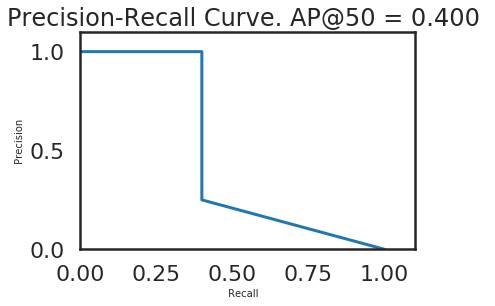

In [52]:
AP, precisions, recalls, overlaps = compute_ap(r['gt_bboxes'], r['gt_class_ids'], r['molded_rois'], r['class_ids'], r['scores'])
visualize.plot_precision_recall(AP, precisions, recalls)

Detected classes: [        44         46         46         56         61         61         74]
[[       200         72        587        136]
 [       139        161        887        972]
 [       130          0        448        302]
 [       323        261        843        829]
 [       632        645        887       1024]
 [       128          2        884       1024]
 [       409          0        895        268]]
Image Meta:  [     44236        338        451          3        128          0        895       1024          1          1]
 Image_id    :  44236  Reference:  http://cocodataset.org/#explore?id=269395 Coco Id: 269395
 Class ids   :  (7,)    [        44         46         46         56         61         61         74]
 Class Names :  ['knife', 'bowl', 'bowl', 'cake', 'dining table', 'dining table', 'book']


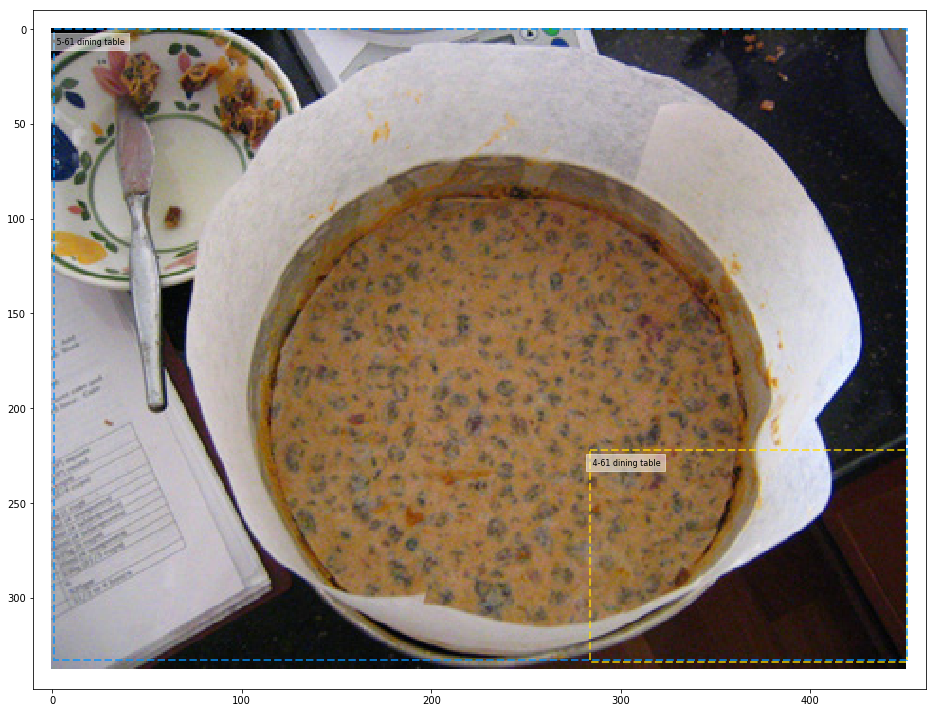

In [43]:
f = fcn_results[0]
clses = [61]
# print('class ids: ', np.unique(f['pr_scores'][:,4]).astype(int).tolist())

print('Detected classes:', f['gt_class_id'])
print(f['gt_bbox'])
print('Image Meta: ', f['orig_image_meta'][:10])
visualize.display_image_gt(dataset_test, mrcnn_model.config, 44236, only_classes=clses)

In [ ]:
len(precisions)
precisions


# Display Heatmaps

In [46]:
from mrcnn.visualize import (plot_one_bbox_heatmap, 
                             plot_3d_heatmap, plot_2d_heatmap, 
                              plot_2d_heatmap_compare, plot_3d_heatmap_compare)
# import matplotlib as plt
# %matplotlib inline
img_id = 0
image_id=f['orig_image_meta'][0]
print('Image id: ',image_id, ' Coco ID: ', dataset_test.image_info[image_id]['id'])
print(f['pr_scores'][:,4])
coco_class_names = dataset_test.class_names
pr_class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
fcn_class_ids = np.unique(f['fcn_scores'][:,4]).astype(int).tolist()
print('Pred class ids: ', pr_class_ids)
print('FCN  class ids: ', fcn_class_ids)

Image id:  10  Coco ID:  131107
[   10.0000    10.0000    10.0000    10.0000    10.0000    10.0000    10.0000    10.0000    10.0000     5.0000]
Pred class ids:  [5, 10]
FCN  class ids:  [5, 10]


## Overlay Images with Heatmaps

### Overlay image with pred_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, inference_heatmaps_display
# visualize.display_image_bw(image)
# print(model_gt_heatmap_scores.shape)
class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
print('class ids: ', class_ids)
inference_heatmaps_display(fcn_results, 0, class_ids = class_ids, class_names = coco_class_names, hm = 'pr_hm' ,config = mrcnn_model.config, scaling = 'class') 
# , display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'pr',  
#                      config = mrcnn_config, class_ids = class_ids)

### Overlay image with fcn_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, inference_heatmaps_display
# visualize.display_image_bw(image)
# print(model_gt_heatmap_scores.shape)
class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
print('class ids: ', class_ids)
inference_heatmaps_display(fcn_results, 0, class_ids = class_ids, class_names = coco_class_names, hm = 'fcn_hm' ,config = mrcnn_model.config, scaling = 'class') 
# , display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'pr',  

### Overlay image with pr_heatmaps and fcn_heatmaps

 Scaling options are: 'all', 'class', 'each' , or  'clip' : 
 heatmap shape:  (256, 256, 81)
 Bounding boxes shape:  (81, 200, 24)
Image shape : (332, 500, 3)  class_ids: [ 5 10]


D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
D:\Program Files\Anaconda3\envs\TF\lib\site-packages\skimage\transform\_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


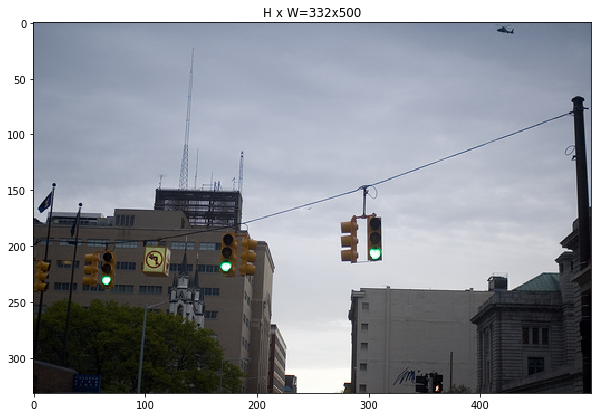

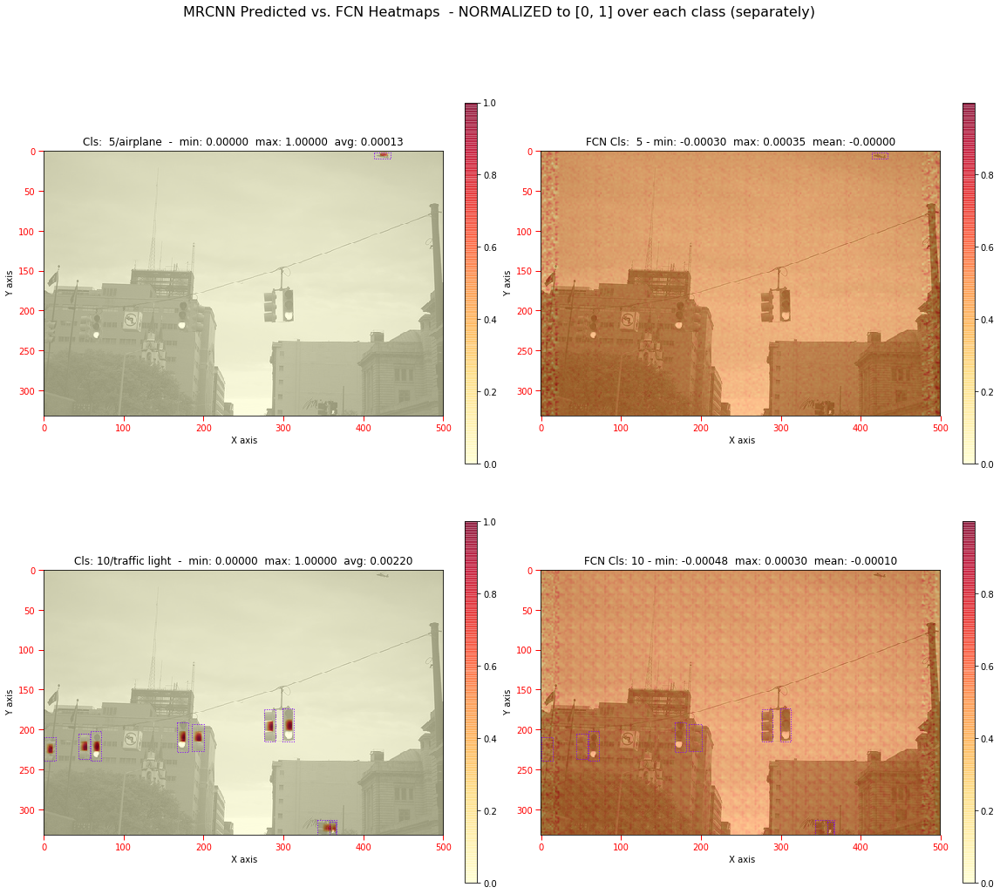

In [29]:
visualize.inference_heatmaps_compare(fcn_results, image_id = 0 , hm = 'fcn_hm', 
                     config = mrcnn_model.config, class_ids = pr_class_ids, class_names = coco_class_names, scaling = 'each')

##  3D Plots

####  3D plot of `fcn_heatmap` returned form model - classes predicted by MRCNN only 

In [ ]:
print(np.max(f['fcn_hm']), np.min(f['fcn_hm']))

print(f['fcn_hm'].shape)
class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
plot_3d_heatmap(f['fcn_hm'], 0, class_ids,class_names = coco_class_names, scaling = 'none')

####  3D plot of `fcn_softmax` returned form model - only classes in pred_scores

In [ ]:
for img_id in [0]: ##range(mrcnn_config.BATCH_SIZE):
    print(f['fcn_hm'].shape)
    class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
    print('Image : {}  ClassIds: {}'.format(img_id, class_ids))
    plot_3d_heatmap(f['fcn_sm'], 0, class_ids,class_names = coco_class_names, scaling = 'none')

## 2D heatmaps

 Scaling options are 'all', 'class'/'each', 'clip', or 'none' 
 Shape of Z:  (256, 256, 81)  boxes:  (81, 200, 24)
 Image Id:  0  Display classes: [ 5 10]
 rows   1  columns : 3 boxes.shape :  (81, 200, 24)
 min_z_all shape: ()  min_z_all: 0.0  max_z_all: () max_z_all: 1.0
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == none 


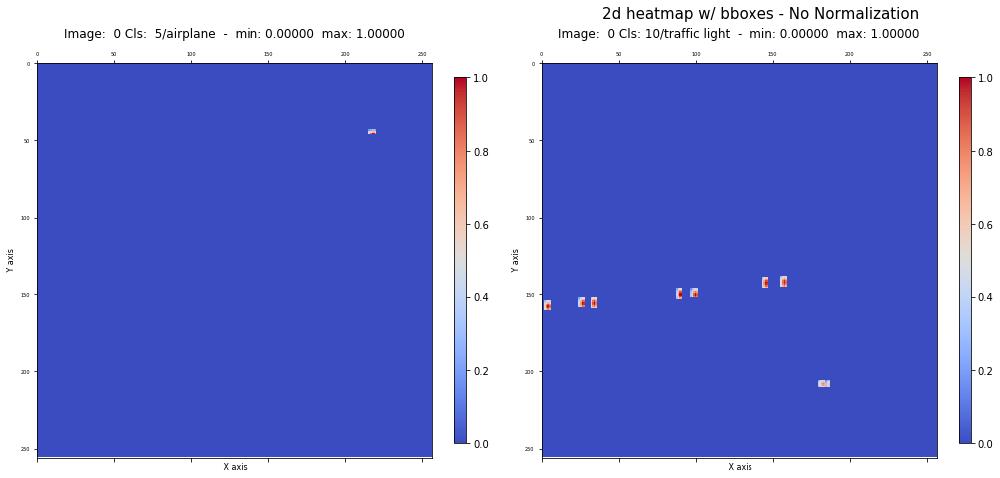

In [47]:
img_id = 0
 
pr_class_ids = np.unique(f['class_ids'])
fig = visualize.plot_2d_heatmap(f['pr_hm'], f['pr_scores_by_class'], img_id, pr_class_ids, columns = 3, num_bboxes = 0,
                          class_names = class_names, scale = 4, scaling = 'none')

 Scaling options are 'all', 'class'/'each', 'clip', or 'none' 
 Shape of Z:  (256, 256, 81)  boxes:  (81, 200, 24)
 Image Id:  0  Display classes: [ 5 10]
 rows   1  columns : 3 boxes.shape :  (81, 200, 24)
 min_z_all shape: ()  min_z_all: -0.48535615  max_z_all: () max_z_all: 0.7116628
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == none 


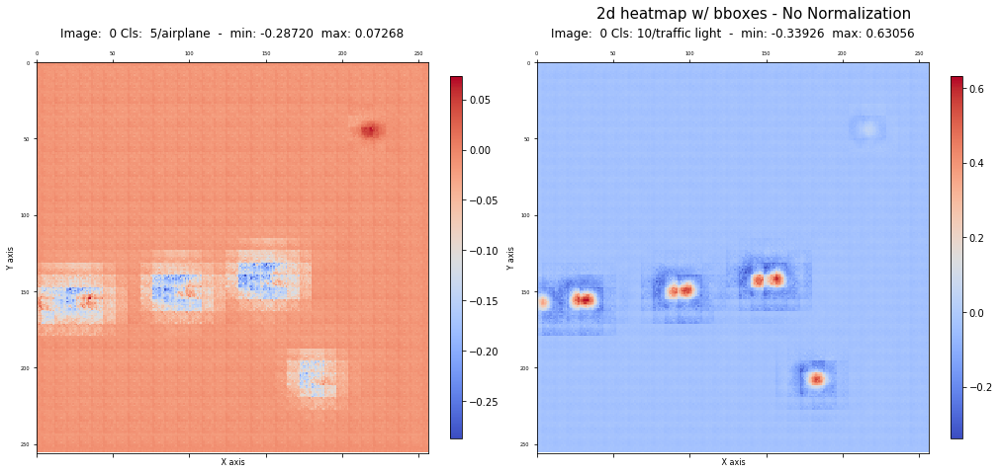

In [48]:
img_id = 0
 
pr_class_ids = np.unique(f['class_ids'])
fig = visualize.plot_2d_heatmap(f['fcn_hm'], f['fcn_scores_by_class'], img_id, pr_class_ids, columns = 3, num_bboxes = 0,
                          class_names = class_names, scale = 4, scaling = 'none')

# Run Object Detection on Random Images

###  Test on loaded image

### Test on a random image from images folder

2502287818_41e4b0c4fb_z.jpg


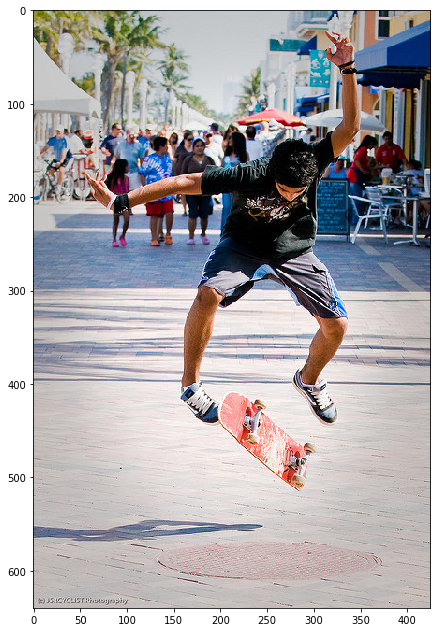

In [6]:
# Load a random image from the images folder
# import mrcnn.visualize as visualize
%matplotlib inline
import random, os
import skimage.io
import matplotlib.pyplot as plt
IMAGE_DIR = 'E:/git_projs/mrcnn3/images'
# IMAGE_DIR = '/esat/tiger/joramas/mscStudentsData/kbardool/projs/mrcnn3/images'
file_names = next(os.walk(IMAGE_DIR))[2]
# print(file_names)
random_filename = random.choice(file_names)
print(random_filename)
image = skimage.io.imread(os.path.join(IMAGE_DIR, random_filename))
plt.figure(figsize=(11,11))
plt.imshow(image)

In [7]:
# Run detection
# results = mrcnn_model.detect([image], verbose=1)
results = fcn_model.detect_from_images(mrcnn_model, [image], verbose=1)

NameError: name 'fcn_model' is not defined

In [ ]:
r = results[0]
for bbox, cls, scr in zip(r['rois'], r['class_ids'],  r['scores']):
    print('{}    {:2d}    {:.<20s}  {:5.4f} '.format(bbox,cls,dataset_test.class_names[cls], scr))
visualize.display_instances(image, r['rois'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=visualize.get_ax(size=16))

###  Display random image from test dataset

In [ ]:
# Load random image and mask. ### 27711 persons and boats
image_id = np.random.choice(dataset_test.image_ids)
image    = dataset_test.load_image(image_id)
mask, class_ids = dataset_test.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset_test.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
print(class_ids.shape[0], bbox.shape[0])
# Display image and instances
# visualize.display_instances_with_mask(image, bbox, mask, class_ids, dataset_train.class_names)
visualize.display_instances(image, bbox, class_ids, dataset_test.class_names)

In [ ]:
results = mrcnn_model.detect([image], verbose=1)

In [ ]:
print('resutls :', results)
# Visualize results
r = results[0]
for bbox, cls, scr in zip(r['rois'], r['class_ids'],  r['scores']):
    print('{}    {:2d}    {:.<20s}  {:5.4f} '.format(bbox,cls,dataset_test.class_names[cls], scr))
visualize.display_instances(image, r['rois'], r['class_ids'], dataset_test.class_names, r['scores'])

### Test on a random image from test dataset

In [ ]:
# Test on a random image
# Validation dataset
# dataset_val = shapes.ShapesDataset()
# dataset_val.load_shapes(50, config.IMAGE_SHAPE[0], config.IMAGE_SHAPE[1])
# dataset_val.prepare()

image_id = random.choice(dataset_test.image_ids)
original_image, image_meta, gt_class_id, gt_bbox =\
    load_image_gt(dataset_test, mrcnn_config, image_id, use_mini_mask=False)
    

print('Image Id :', image_id)    
shape_list = dataset_test.image_info[image_id] 
pp.pprint(shape_list)
log("original_image", original_image)
log("image_meta", image_meta)
print(image_meta)
log("gt_class_id", gt_bbox)
log("gt_bbox", gt_bbox)
# log("gt_mask", gt_mask)

print(" 1: person   2: car  3: sun  4: building  5: tree  6: cloud ")
visualize.display_instances(original_image, gt_bbox, gt_class_id, 
                            dataset_test.class_names, figsize=(8, 8))

In [ ]:
results = model.detect([original_image], verbose=1)

In [ ]:
r = results[0]
print('  rois       : ', r['rois'])
print('  masks      : ', r['masks'].shape)
print('  class ids  : ', r['class_ids'])
print('  class names: ', dataset_test.class_names)
print('  scores     : ', r['scores'])
visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_test.class_names, r['scores'], ax=get_ax())